# CARDIO CATCH DISEASES

## 0. INTRODUCTION

### 0.1 Planning

#### Input

-   Create a tool that increases the diagnostic accuracy;

-   Database with patient diagnoses;

#### Output

-   Model with stable accuracy for all situationsPerformance of the model;

-   Most important patient characteristics;

-   Tool that can be easy used by health specialists;

#### Tasks

1.  What information is important for predicting heart problems?
    -   Is blood pressure the most important parameter?


2.  Performance of the model:
    -   Can accuracy alone solve this problem?
    
    -   What is the minimum value required for a model used in health problems?


3.  Action Plan:
    -   User-friendly website to enter patient data and return forecast

### 0.2 Imports

In [151]:
import pickle
import numpy    as np
import pandas   as pd
import seaborn  as sns
import sweetviz as sv

from IPython.core.display       import HTML, Image
from typing                     import Union
from sklearn.model_selection    import train_test_split, KFold
from matplotlib                 import pyplot                           as plt

from scipy                      import stats

from sklearn.preprocessing      import MinMaxScaler, RobustScaler

from sklearn.ensemble           import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier

from yellowbrick.features       import Rank1D
from boruta                     import BorutaPy

from xgboost                    import XGBClassifier
from lightgbm                   import LGBMClassifier
from catboost                   import CatBoostClassifier

import optuna
from optuna.integration         import LightGBMPruningCallback

from sklearn.linear_model       import LogisticRegression
from sklearn.feature_selection  import RFE
from sklearn.naive_bayes        import GaussianNB
from sklearn.metrics            import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.neighbors          import KNeighborsClassifier
from sklearn.preprocessing      import MinMaxScaler, RobustScaler


### 0.3 Helper Functions

In [2]:
def numerical_metrics(numerical_attributes: Union[int, float]):
    """Shows the main values ​​for descriptive statistics in numerical variables.

    Args:
        numerical_attributes ([float64 and int64]): [Insert all numerical attributes in the dataset]

    Returns:
        [dataframe]: [A dataframe with mean, median, std deviation, skewness, kurtosis, min, max and range]
    """
    
    data_mean = pd.DataFrame(numerical_attributes.apply(np.mean)).T
    data_median = pd.DataFrame(numerical_attributes.apply(np.median)).T
    data_std = pd.DataFrame(numerical_attributes.apply(np.std)).T
    data_min = pd.DataFrame(numerical_attributes.apply(min)).T
    data_max = pd.DataFrame(numerical_attributes.apply(max)).T
    data_range = pd.DataFrame(numerical_attributes.apply(lambda x: x.max() - x.min())).T
    data_q1 = pd.DataFrame(numerical_attributes.apply(lambda x: np.quantile(x, .25))).T
    data_q3 = pd.DataFrame(numerical_attributes.apply(lambda x: np.quantile(x, .75))).T
    data_skew = pd.DataFrame(numerical_attributes.apply(lambda x: x.skew())).T
    data_kurtosis = pd.DataFrame(numerical_attributes.apply(lambda x: x.kurtosis())).T

    num_attributes = pd.concat([data_min,data_max,data_range,data_mean,data_median, data_q1, data_q3,data_std,data_skew,data_kurtosis]).T.reset_index()
    num_attributes.columns = ['Attributes','Min','Max','Range','Mean','Median','Q1','Q3', 'St deviation','Skewness','Kurtosis']

    return num_attributes

In [3]:
def categorical_metrics(data: Union[int, str], col: str):
    """
    Shows the the absolute and percent values in categorical variables.

    Args:
        data ([dataframe]): [Insert all categorical attributes in the dataset]

    Returns:
        [dataframe]: [A dataframe with absolute and percent values]
    """
    
    return pd.DataFrame({'absolute': data[col].value_counts(), 'percent %': data[col].value_counts(normalize = True) * 100 })

In [4]:
def cat_convert(data: Union[int, float]):
     """
     Revert the Encoding on Categorical Features
 
     Args:
        data ([dataframe]): [Insert all categorical attributes in the dataset]

     Returns:
        data ([dataframe]): [Categorical Dataframe]
     """

     data['gender'] = data['gender'].apply(lambda x: 'woman' if x == 1 else 'man')
     
     data['smoker'] = data['smoker'].apply(lambda x: 'yes' if x == 1 else 'no') 
     
     data['alcohol_intake'] = data['alcohol_intake'].apply(lambda x: 'yes' if x == 1 else 'no')   
     
     data['physical_activity'] = data['physical_activity'].apply(lambda x: 'yes' if x == 1 else 'no')    
     
     data['cardio_result'] = data['cardio'].apply(lambda x: 'yes' if x == 1 else 'no') 
     
     data['cholesterol'] = data['cholesterol'].apply(lambda x: 'normal' if x == 1 else
                                                      'above normal' if x == 2 else
                                                      'well above normal')

     data['glucose'] = data['glucose'].apply(lambda x: 'normal' if x == 1 else
                                             'above normal' if x == 2 else
                                             'well above normal')

     return data    

In [5]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    plt.style.use('tableau-colorblind10')
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    display(HTML('<style>.container { width:100% !important; }</style>'))
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option('display.expand_frame_repr', False)
    sns.set()

jupyter_settings()

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [6]:
def multiple_kdeplots(df: Union[int, float, str], rows: int, cols: int):
    """
    Shows a matrix with kdeplots of selected features.

    Args:
        df ([dataframe]): [Insert all categorical attributes in the dataset]
        rows ([int]): [Insert the number of rows of the subplot]
        cols ([int]): [Insert the number of columns of the subplot]

    Returns:
        [Image]: [A matrix plot with kdeplots]
    """

    for i, col in enumerate(df.columns, 1):
        plt.subplot(rows, cols, i)
        ax = sns.kdeplot(data = df, x = col)
        plt.ylabel('')

    return ax

In [7]:
def multiple_boxplots(df: Union[int, float, str], rows: int, cols: int):
    """
    Shows a matrix with boxplots of selected features.

    Args:
        df ([dataframe]): [Insert all categorical attributes in the dataset]
        rows ([int]): [Insert the number of rows of the subplot]
        cols ([int]): [Insert the number of columns of the subplot]

    Returns:
        [Image]: [A matrix plot with boxplots]
    """

    for i, col in enumerate(df.columns, 1):
        plt.subplot(rows, cols, i)
        ax = sns.boxplot(data = df, x = col)
        plt.ylabel('')

    return ax

In [8]:
def kdeplots_cat(df: Union[int, float, str], rows: int, cols: int, target: str):
    """
    Shows a matrix with kdeplots of selected features with hue.

    Args:
        df ([dataframe]): [Insert all categorical attributes in the dataset]
        rows ([int]): [Insert the number of rows of the subplot]
        cols ([int]): [Insert the number of columns of the subplot]
        target ([str]): [Target Feature]

    Returns:
        [Image]: [A matrix plot with kdeplots]
    """

    for i, col in enumerate(df.columns, 1):
        plt.subplot(rows, cols, i)
        ax = sns.kdeplot(data = df, x = target, hue = col, shade = True, palette = 'tab10', warn_singular = False)

    return ax

In [9]:
def correlation_matrix(data: Union[int, float], method: str):
    """Generates a correlation matrix of numerical variables

    Args:
        data ([DataFrame]): [The dataframe of the EDA]
        method ([string]): [The method used, it can be ‘pearson’, ‘kendall’ or ‘spearman’]

    Returns:
        [Image]: [The correlation matrix plot made with seaborn]
    """
    
    # correlation
    num_attributes = data.select_dtypes(include = ['int64', 'float64'])
    correlation = num_attributes.corr(method = method)

    # plot
    ax = sns.heatmap(correlation, fmt = '.2f', vmin = -1, vmax = 1, annot = True, cmap = 'magma', square = True).set(title = 'Correlation Matrix')

    return ax

In [10]:
def correlation_ascending(data: Union[int, float, str], col: str, method: str):
    """Generates a correlation matrix of each numerical variables in ascending order.

    Args:
        data ([dataFrame]): [The dataframe of the EDA]
        col ([object]): [The column selected]
        method ([string]): [The method used, it can be ‘pearson’, ‘kendall’ or ‘spearman’]

    Returns:
        [Image]: [The correlation matrix plot made with seaborn]
    """

    # correlation
    num_attributes = data.select_dtypes(include = ['int64', 'float64'])
    correlation = num_attributes.corr(method = method)

    correlation_asc = correlation[col].sort_values(ascending=False).to_frame()
    correlation_asc.columns = ['']
    correlation_asc.drop(col, axis=0, inplace=True)
    plot = sns.heatmap( correlation_asc, annot=True, cmap='rocket').set_title(col);
    
    return plot

In [11]:
def corr_cat(data: Union[str, int]):
    """Calculates Correlation Matrix for Categorical Features using Cramer's V

    Args:
        data ([DataFrame]): [The dataframe with all categorical features]


    Returns:
        [Image]: [Correlation Matrix]
    """



    categorical_attributes = data.select_dtypes(exclude = ['int64', 'float64'])
    cat_attributes_list = categorical_attributes.columns.tolist()

    corr_dict = {}

    for i in range(len(cat_attributes_list)):
        corr_list = []
        for j in range(len(cat_attributes_list)):
            ref = cat_attributes_list[i]
            feat = cat_attributes_list[j]
            cm = pd.crosstab(categorical_attributes[ref], categorical_attributes[feat]).to_numpy()
            n = cm.sum()
            r, k = cm.shape
            chi2 = stats.chi2_contingency(cm)[0]
            chi2corr = max(0, chi2 - (k - 1)*(r - 1)/(n - 1))
            kcorr = k - (k - 1)**2/(n - 1)
            rcorr = r - (r - 1)**2/(n - 1)
            corr = np.sqrt((chi2corr/n) / (min(kcorr - 1, rcorr - 1)))
            corr_list.append(corr)
        
        corr_dict[ref] = corr_list

    corr_df = pd.DataFrame(corr_dict)
    plot = sns.heatmap(corr_df, fmt = '.2f', vmin = -1, vmax = 1, annot = True, cmap = 'magma', square = True).set(title = 'Correlation Matrix: Categorical Features');
    
    return plot;

In [12]:
def plot_with_target(target_x: Union[int, float, str], target_y: Union[int, float, str], col: str, position_x: int, position_y: int, label_x: str, label_y: str):
    """
    Create some histplots with target feature.

    Args:
        target_x ([dataframe]): [Dataframe with all numerical features and positive target]
        target_y ([dataframe]): [Dataframe with all numerical features and negative target]
        col ([str]): [Name of the feature of the plot]
        position_x ([int]): [Position in the subplot]
        position_y ([int]): [Position in the subplot]
        label_x ([str]): [Name of the label of negative target]
        label_y ([str]): [Name of the label of positive target]

    Returns:
        [Image]: [Histplots of all features with target]
    """

    plt.style.use('tableau-colorblind10')
    ax[position_x, position_y].hist(target_x[col], bins = 200, alpha = 0.5, label = label_x) 
    ax[position_x, position_y].hist(target_y[col], bins = 200, alpha = 0.7, label = label_y) 
    ax[position_x, position_y].legend()
    ax[position_x, position_y].set_title(col)

    return ax

In [13]:
def percentage(ax,data: Union[str, int, float]):
    """Shows percentage in countplots

    Args:
        ax: [Variable name of the plot]
        data ([DataFrame]): [Dataframe of the countplot]


    Returns:
        [Dict]: [Dictionary with cramer's V]
    """
    for p in ax.patches:
        height = p.get_height()
        len_data = len(data)
        ax.text(p.get_x()+p.get_width()/2.,
                height,
                '{:1.2f}%'.format(height/len_data*100),
                ha="center")

In [14]:
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

In [15]:
def metrics_df(models, target: str, X_train: Union[int, float, str], y_train: Union[int, float, str], X_val: Union[int, float, str], y_val: Union[int, float, str], verbose = True):
    """Return Metrics of the model
    
    Args:
        model: [ML model for metrics evaluation]
        target[str]: [Target feature name]
        X_train[dataframe]: [Train variables]
        y_train[list]: [Target feature list]
        X_val[dataframe]: [Validation variables]
        y_val[list]: [Target feature list]
        verbose[bool]: [print training]

    Returns:
        [DataFrame]: [Dataframe with metrics]
    """
    print('Please, wait a moment - Doing ML')
    model_df = []
    i = 1
    j = len(models)

    for model in models:
        model_name = type(model).__name__
        if verbose == True:
            print(f"Training model {i}/{j} -> " + model_name)
        model.fit(X_train, y_train)

        # probabilities prediction
        yhat = model.predict(X_val)

        # accuracy
        accuracy = accuracy_score(y_val, yhat)

        # precision
        precision = precision_score(y_val, yhat)

        # recall
        recall = recall_score(y_val, yhat)

        # specificity
        specificity = recall_score(y_val, yhat, pos_label = 0)

        # roc auc
        roc_auc = roc_auc_score(y_val, yhat)

        i += 1

        df_result = pd.DataFrame({'Model_Name': model_name, 
                                  'Accuracy': accuracy,
                                  'Precision': precision,
                                  'Recall': recall,
                                  'Specificity': specificity,
                                  'ROCAUC': roc_auc}, index = [0])

        model_df.append(df_result)
        final_result = pd.concat(model_df)
    print('Finished, check the results')

    return final_result

In [16]:
def cross_validation(models, target: str, X_train: Union[int, float, str], y_train: Union[int, float, str], kfold: int = 5, verbose: bool = True):
    """Return CV result
    
    Args:
        model: [ML model for CV]
        target[str]: [Target feature name]
        X_train[dataframe]: [Train variables]
        y_train[list]: [Target feature list]
        kfold[int]: [Number of data splits]
        verbose[bool]: [print folding]

    Returns:
        [DataFrame]: [Dataframe for CV]
    """
    print('Please, wait a moment, Doing CV')
    folds = KFold(n_splits = kfold, shuffle = True, random_state = 42)
    accuracy_list = []
    precision_list = []
    recall_list = []
    spec_list = []
    roc_auc_list = []

    model_df = []
    j = 1
    l = len(models)
    
    for model in models:
        model_name = type(model).__name__
        if verbose == True:
            print(f"Folding model {j}/{l} -> " + model_name)

        for train_cv, val_cv in folds.split(X_train, y_train):
            X_train_fold = X_train.iloc[train_cv]
            y_train_fold = y_train.iloc[train_cv]
            X_val_fold = X_train.iloc[val_cv]
            y_val_fold = y_train.iloc[val_cv]

            # fit model
            model.fit(X_train_fold, y_train_fold)
            
            # predict probabilities
            yhat = model.predict(X_val_fold)

            data = X_val_fold.copy()
            data[target] = y_val_fold.copy()

            # accuracy
            accuracy = accuracy_score(y_val_fold, yhat)
            accuracy_list.append(accuracy)

            # precision
            precision = precision_score(y_val_fold, yhat)
            precision_list.append(precision)

            # recall
            recall = recall_score(y_val_fold, yhat)
            recall_list.append(recall)
        
            # specificity
            specificity = recall_score(y_val_fold, yhat, pos_label = 0)
            spec_list.append(specificity)

            # roc auc
            roc_auc = roc_auc_score(y_val_fold, yhat)
            roc_auc_list.append(roc_auc)


        df_result = pd.DataFrame({'Model_Name': (model_name),
                                  'Accuracy Mean': np.mean(accuracy_list).round(3),
                                  'Accuracy STD': np.std(accuracy_list).round(3),
                                  'Precision Mean': np.mean(precision_list).round(3),
                                  'Precision STD': np.std(precision_list).round(3),
                                  'Recall Mean': np.mean(recall_list).round(3),
                                  'Recall STD': np.std(recall_list).round(3),
                                  'Specificity Score Mean': np.mean(spec_list).round(3),
                                  'Specificity Score STD': np.std(spec_list).round(3),
                                  'ROCAUC Mean': np.mean(roc_auc_list).round(3),
                                  'ROCAUC STD': np.std(roc_auc_list).round(3)}, index = [0])
        
        j += 1

        model_df.append(df_result)
        cv_result = pd.concat(model_df)
    print('Finished, check the results')

    return cv_result

In [17]:
def objective_adb(trial: int, X, y, splits: int = 5):
    """Apply parameters for Optuna bayesian search using accuracy as metric
    Args:
        trial[int]: [Number of attempts to find the best result]
        X[Dataframe]: [Dataframe with all features except target]
        y[List]: [List with the target feature]
        splits[int]: [Number of splits for the Kfold n_splits]

    Returns:
        [str]: [Results Optuna]
    """
    
    param_grid = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 2000, step = 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3)
                }

    folds = KFold(n_splits = splits, shuffle = True, random_state = 42)
    accuracy_list = []
    for train_cv, val_cv in folds.split(X, y):
        X_train_fold = X.iloc[train_cv]
        y_train_fold = y.iloc[train_cv]
        X_val_fold = X.iloc[val_cv]
        y_val_fold = y.iloc[val_cv]

        model = AdaBoostClassifier(**param_grid)
        model.fit(X_train_fold, y_train_fold)
        yhat = model.predict(X_val_fold)
        accuracy = accuracy_score(y_val_fold, yhat)
        accuracy_list.append(accuracy)

    return np.mean(accuracy_list)



def objective_gb(trial: int, X, y, splits: int = 5):
    """Apply parameters for Optuna bayesian search using logloss as metric
    Args:
        trial[int]: [Number of attempts to find the best result]
        X[Dataframe]: [Dataframe with all features except target]
        y[List]: [List with the target feature]
        splits[int]: [Number of splits for the StratifiedKfold n_splits]

    Returns:
        [str]: [Results Optuna]
    """
    
    param_grid = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 2000, step = 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 15),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5)
                }

    folds = KFold(n_splits = splits, shuffle = True, random_state = 42)
    accuracy_list = []
    for train_cv, val_cv in folds.split(X, y):
        X_train_fold = X.iloc[train_cv]
        y_train_fold = y.iloc[train_cv]
        X_val_fold = X.iloc[val_cv]
        y_val_fold = y.iloc[val_cv]

        model = GradientBoostingClassifier(**param_grid)
        model.fit(X_train_fold, y_train_fold)
        yhat = model.predict(X_val_fold)
        accuracy = accuracy_score(y_val_fold, yhat)
        accuracy_list.append(accuracy)

    return np.mean(accuracy_list)


def objective_lgbm(trial: int, X, y, splits: int = 5):
    """Apply parameters for Optuna bayesian search using logloss as metric
    Args:
        trial[int]: [Number of attempts to find the best result]
        X[Dataframe]: [Dataframe with all features except target]
        y[List]: [List with the target feature]
        splits[int]: [Number of splits for the StratifiedKfold n_splits]

    Returns:
        [str]: [Results Optuna]
    """
    
    param_grid = {
        'n_estimators': trial.suggest_int('n_estimators', 300, 2000, step = 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.1, 0.3),
        'num_leaves': trial.suggest_int('num_leaves', 20, 3000, step = 20),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 200, 10000, step = 100),
        'lambda_l1': trial.suggest_int('lambda_l1', 0, 100, step = 5),
        'lambda_l2': trial.suggest_int('lambda_l2', 0, 100, step = 5),
        'min_gain_to_split': trial.suggest_float('min_gain_to_split', 1, 15),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.2, 0.9, step = 0.1),
        'bagging_freq': trial.suggest_categorical('bagging_freq', [1]),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.2, 0.9, step=0.1)
                }

    folds = KFold(n_splits = splits, shuffle = True, random_state = 42)
    accuracy_list = []
    for train_cv, val_cv in folds.split(X, y):
        X_train_fold = X.iloc[train_cv]
        y_train_fold = y.iloc[train_cv]
        X_val_fold = X.iloc[val_cv]
        y_val_fold = y.iloc[val_cv]

        model = LGBMClassifier(objective = 'binary', **param_grid)
        model.fit(X_train_fold, y_train_fold)
        yhat = model.predict(X_val_fold)
        accuracy = accuracy_score(y_val_fold, yhat)
        accuracy_list.append(accuracy)

    return np.mean(accuracy_list)

### 0.4 Settings

In [18]:
# round
pd.options.display.float_format = '{:.3f}'.format

seed = 42

homepath = '/home/gutto/Repos/Cardio-Catch-Diseases/'

### 0.5 Data

This dataset is avaliable [here](https://www.kaggle.com/sulianova/cardiovascular-disease-dataset).

There are 3 types of input features:

Objective: factual information;

Examination: results of medical examination;

Subjective: information given by the patient.


**Data fields**

-   **Age:** *Objective Feature* | Age in days
-   **Height:** *Objective Feature* | Height in cm
-   **Weight:** *Objective Feature* | Weight in kg
-   **Gender:** *Objective Feature* | Biological gender, can be Male or Female, 1- Woman, 2- Man
-   **Systolic blood pressure (ap_hi):** *Examination Feature*
-   **Diastolic blood pressure (ap_lo):** *Examination Feature*
-   **Cholesterol:** *Examination Feature* | Can be classified as 1: normal, 2: above normal, 3: well above normal
-   **Glucose:** *Examination Feature* | Can be classified as 1: normal, 2: above normal, 3: well above normal
-   **Smoking:** *Subjective Feature* | Can be smoke or binary
-   **Alcohol intake:** *Subjective Feature* | Can be alco or binary
-   **Physical activity:** *Subjective Feature* | Can be active or binary
-   **Presence or absence of cardiovascular disease:** *Target Variable* | Can be cardio or binary

In [19]:
df_raw = pd.read_csv(homepath + '/data/raw/cardio_train.csv', sep = ';')

df_raw.to_pickle(homepath + 'data/processed/df_raw.pkl')

## 1. DATA DESCRIPTION

### 1.1 Dataset First Look

In [20]:
df1 = pd.read_pickle(homepath + 'data/processed/df_raw.pkl')

In [21]:
df1.head().T

,0,1,2,3,4
id,0.000,1.000,2.000,3.000,4.000
age,18393.000,20228.000,18857.000,17623.000,17474.000
gender,2.000,1.000,1.000,2.000,1.000
height,168.000,156.000,165.000,169.000,156.000
weight,62.000,85.000,64.000,82.000,56.000
ap_hi,110.000,140.000,130.000,150.000,100.000
ap_lo,80.000,90.000,70.000,100.000,60.000
cholesterol,1.000,3.000,3.000,1.000,1.000
gluc,1.000,1.000,1.000,1.000,1.000
smoke,0.000,0.000,0.000,0.000,0.000


In [22]:
df1.rename(columns = {'gluc': 'glucose', 'alco': 'alcohol_intake', 'smoke': 'smoker', 'alco': 'alcohol_intake', 'active': 'physical_activity'}, inplace = True)

### 1.2 Data Dimensions

In [23]:
print(f'Number of rows: {df1.shape[0]} \nNumber of columns: {df1.shape[1]}')

Number of rows: 70000 
Number of columns: 13


### 1.3 Check Data

In [24]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 70000 non-null  int64  
 1   age                70000 non-null  int64  
 2   gender             70000 non-null  int64  
 3   height             70000 non-null  int64  
 4   weight             70000 non-null  float64
 5   ap_hi              70000 non-null  int64  
 6   ap_lo              70000 non-null  int64  
 7   cholesterol        70000 non-null  int64  
 8   glucose            70000 non-null  int64  
 9   smoker             70000 non-null  int64  
 10  alcohol_intake     70000 non-null  int64  
 11  physical_activity  70000 non-null  int64  
 12  cardio             70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


### 1.4 Change Units

In [25]:
# Converting Age from days to years
df1['age'] = df1['age'].apply(lambda x: x / 365)
df1['age'] = df1['age'].astype(int)

# Converting Height from cm to m
df1['height'] = df1['height'].apply(lambda x: x / 100)

### 1.5 Descriptive Statistics

#### 1.5.1 SweetViz Report

                                             |          | [  0%]   00:00 -> (? left)


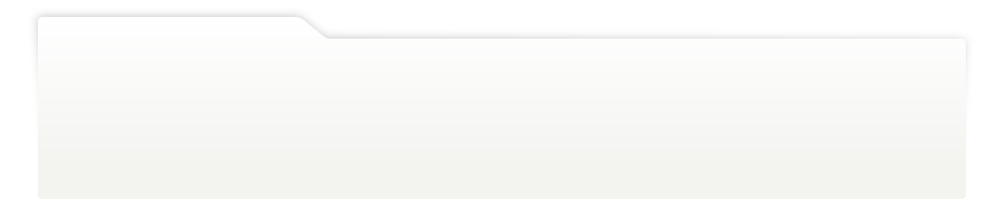
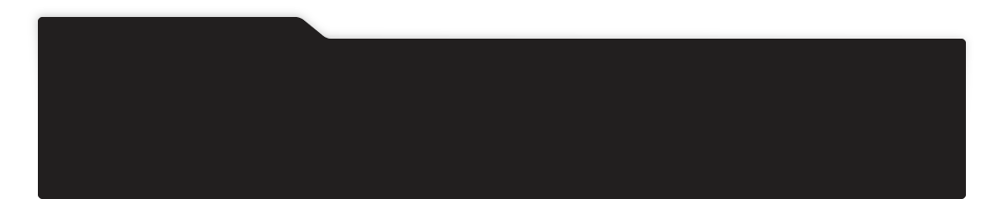
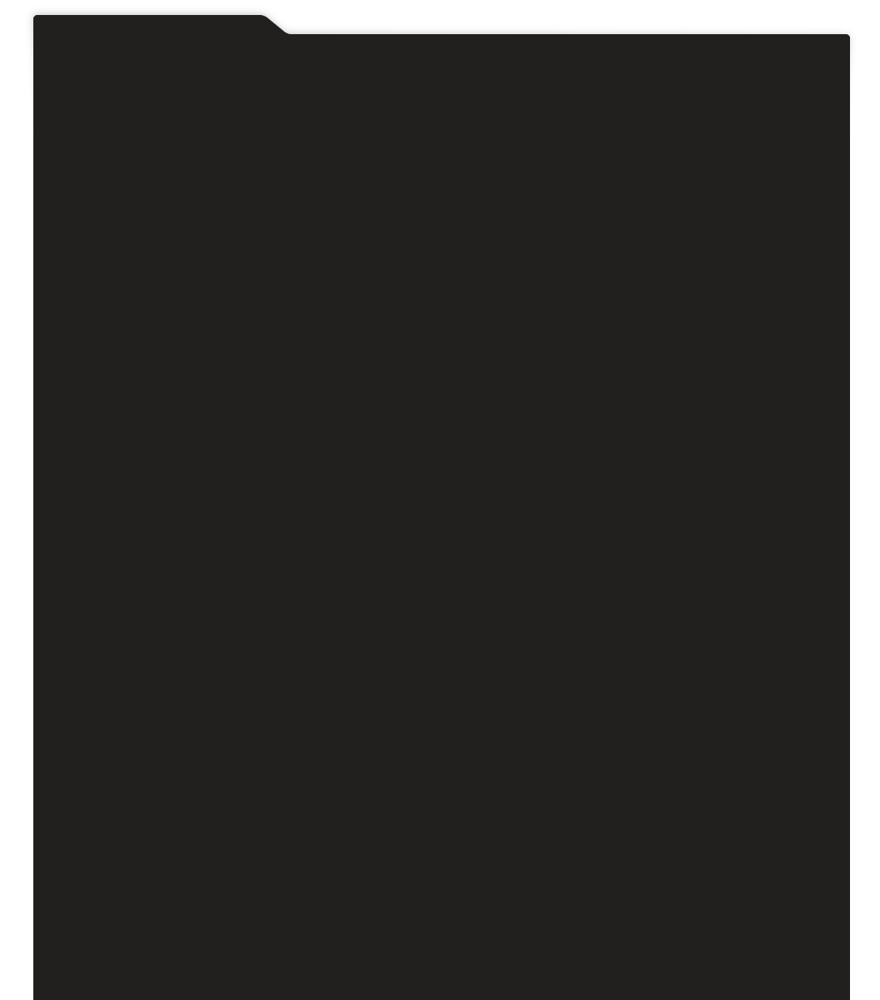
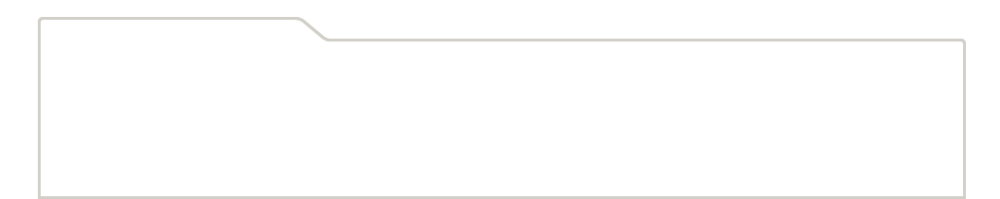
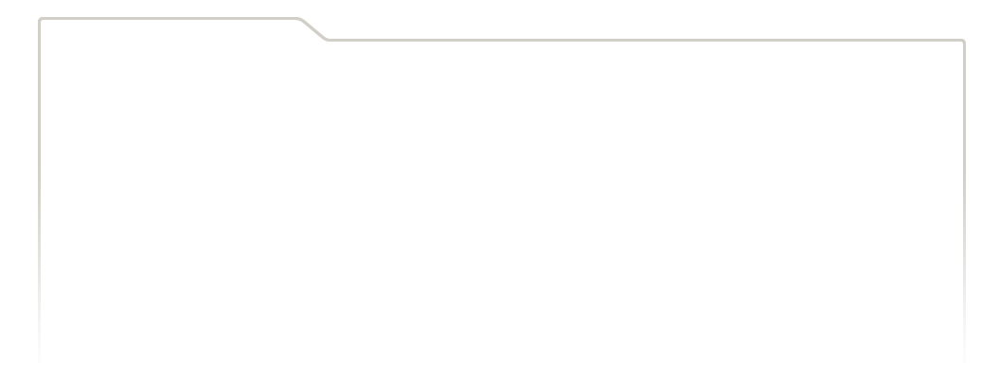
...
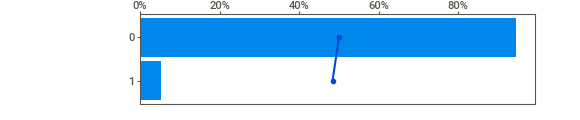
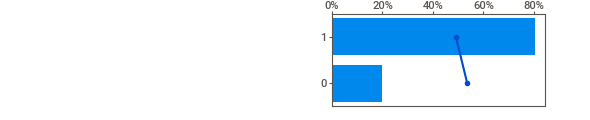
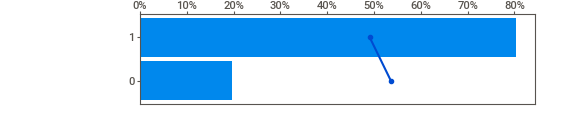
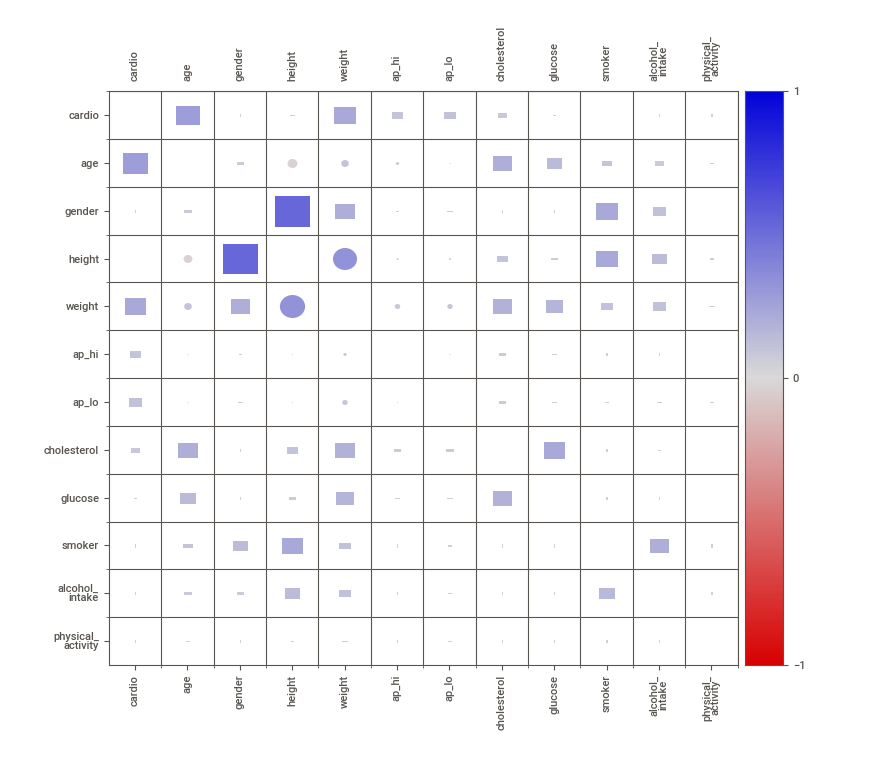
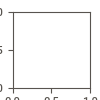

In [26]:
feature_config = sv.FeatureConfig(skip = 'id', force_cat = ['gender', 'cholesterol', 'glucose', 'smoker', 'alcohol_intake', 'physical_activity'])
report_1 = sv.analyze([df1, 'Cardio Catch Diseases'], 'cardio', feature_config)

report_1.show_notebook(layout = 'vertical', scale = 0.9)

**Report Insights**

*Target*

1. `cardio`
    - the feature is balanced (50/50);
    - highest correlation ratios is `age`(0.24) and `weight`(0.18);
    - `cholesterol` and `glucose` seems to be a little relevant to the target;

*Numerical Features*

2. `age`
    - should be in year, not days;
    - highest correlation ratios are `cardio`(0.24) and `glucose`(0.16);
    - negative skewed curve;
    - negative kurtosis(platykurtic);

3. `height`
    - should be in m, not cm;
    - highest correlation ratios are `weight`(0.29), `gender`(0.5) and `smoker`(0.19);
    - negative skewed curve;
    - positive kurtosis(leptokurtic);

4. `weight`
    - highest correlation ratios are `height`(0.29), `cardio`(0.18) and `gender`(0.16);
    - positive skewed curve;
    - positive kurtosis(leptokurtic);
    - Highest weight is 200kg and min 10 **need attention**;

5. `ap_hi` (systolic blood pressure)
    - no strong correlation to be cited;
    - positive skewed curve;
    - positive kurtosis(leptokurtic);
    - avg and median are ok;
    - Highest weight is 16020 and min -150 **need attention**;

6. `ap_lo` (diastolic blood pressure)    
    - no strong correlation to be cited;
    - positive skewed curve;
    - positive kurtosis(leptokurtic);
    - avg and median are ok;
    - Highest weight is 11000 and min -70 **need attention**;

*Categorical Features*

7. `gender`
    - unbalanced (65/35) but seems to be the normal in reality;
    - highest correlation ratios are `smoker`(0.19) and `height`(0.5);

8. `cholesterol`
    - unbalanced (75/14/12) but seems to be the normal in reality;
    - highest correlation ratios are `glucose`(0.19) and `age`(0.16);

9. `glucose`
    - unbalanced (85/8/7) but seems to be the normal in reality;
    - highest correlation ratios are `smoker`(0.14) and `height`(0.12);

10. `smoker`
    - unbalanced (91/9) but seems to be the normal in reality;
    - highest correlation ratios are `gender`(0.19), `smoker`(0.16) and `height`(0.19);

11. `alcohol_intake`
    - unbalanced (95/5) but seems to be the 'normal' in reality;
    - highest correlation ratios are `smoker`(0.16) and `height`(0.09);


12. `physical_activity`
    - unbalanced (80/20) but seems to be the normal in reality;
    - no strong correlation to be cited, this feature can be possibly dropped in the future steps;

#### 1.5.2 Numerical Attributes

In [27]:
num_attributes = df1[['age', 'height', 'weight', 'ap_hi', 'ap_lo']]

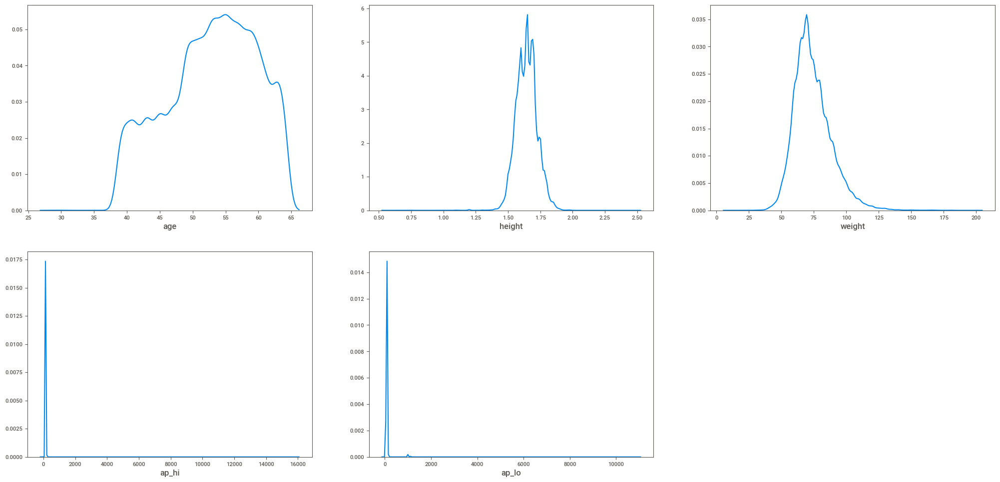

In [28]:
multiple_kdeplots(num_attributes, 2, 3);

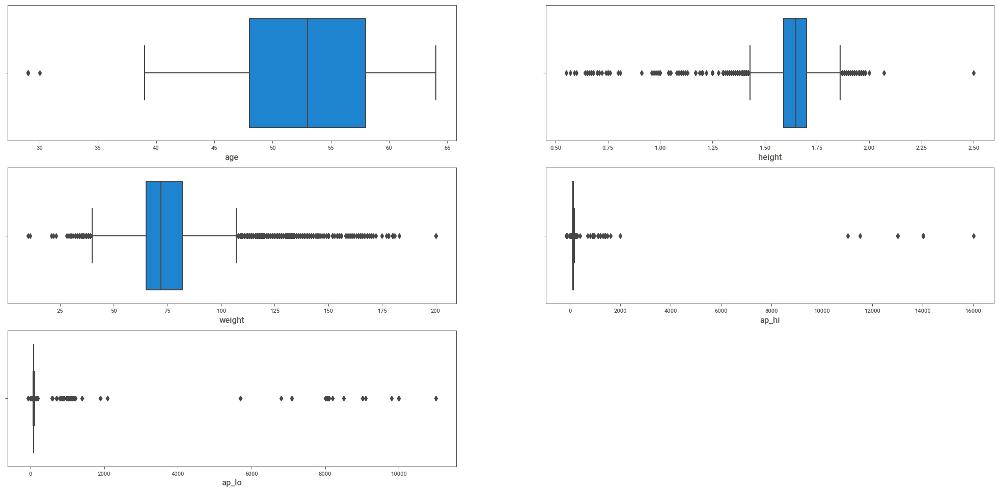

In [29]:
multiple_boxplots(num_attributes, 3, 2);

#### 1.5.3 Categorical Attributes

In [30]:
df1_cat = df1.copy()

df1_cat = cat_convert(df1_cat)

cat_attributes = df1_cat[['gender', 'cholesterol', 'glucose', 'smoker', 'alcohol_intake', 'physical_activity', 'cardio', 'cardio_result']]
cat_attributes.head()

,gender,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio,cardio_result
0,man,normal,normal,no,no,yes,0,no
1,woman,well above normal,normal,no,no,yes,1,yes
2,woman,well above normal,normal,no,no,no,1,yes
3,man,normal,normal,no,no,yes,1,yes
4,woman,normal,normal,no,no,no,0,no


In [31]:
categorical_metrics(cat_attributes, 'gender')

,absolute,percent %
woman,45530,65.043
man,24470,34.957


In [32]:
categorical_metrics(cat_attributes, 'cholesterol')

,absolute,percent %
normal,52385,74.836
above normal,9549,13.641
well above normal,8066,11.523


In [33]:
categorical_metrics(cat_attributes, 'glucose')

,absolute,percent %
normal,59479,84.970
well above normal,5331,7.616
above normal,5190,7.414


In [34]:
categorical_metrics(cat_attributes, 'smoker')

,absolute,percent %
no,63831,91.187
yes,6169,8.813


In [35]:
categorical_metrics(cat_attributes, 'alcohol_intake')

,absolute,percent %
no,66236,94.623
yes,3764,5.377


In [36]:
categorical_metrics(cat_attributes, 'physical_activity')

,absolute,percent %
yes,56261,80.373
no,13739,19.627


That info is strange, I believed that the percentage of people who exercised would be much lower

In [37]:
categorical_metrics(cat_attributes, 'cardio_result')

,absolute,percent %
no,35021,50.030
yes,34979,49.970


### 1.6 Data Filtering

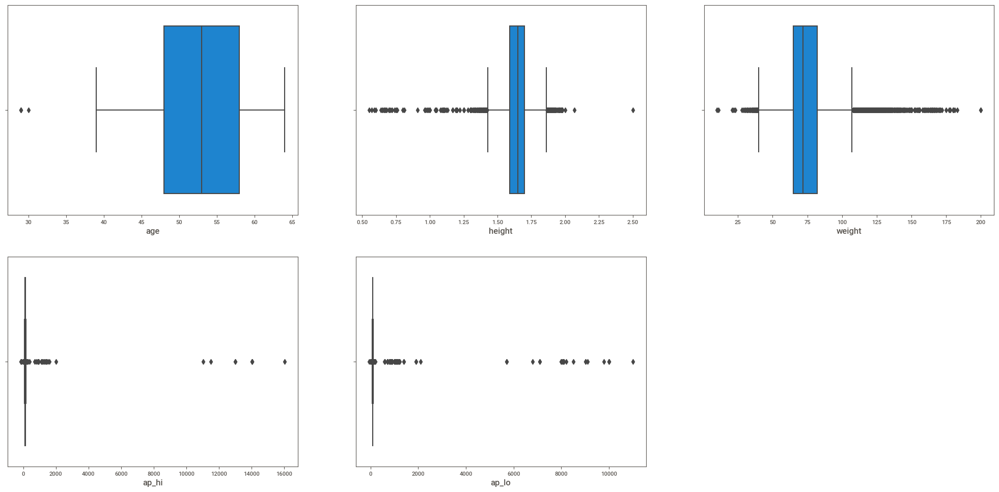

In [38]:
multiple_boxplots(df1[['age', 'height', 'weight', 'ap_hi', 'ap_lo']], 2, 3);

#### 1.6.1 `ap_hi` and `ap_lo`

1. There are a lot of values ​​at pressures above 400, 500, my theory is that this would be a typo where the person who measured would have added an extra 0 unintentionally.
2. Negative pressure values ​​can be another typo, where add one - accidentally

In [39]:
df1[df1['ap_hi'] >= 400].head(3)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio
1876,2654,41,1,1.600,60.000,902,60,1,1,0,0,1,0
2014,2845,62,2,1.670,59.000,906,0,1,1,0,0,1,0
4817,6822,39,1,1.680,63.000,909,60,2,1,0,0,1,0


In [40]:
df1[df1['ap_hi'] < 0].head(3)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio
4607,6525,41,1,1.650,78.000,-100,80,2,1,0,0,1,0
16021,22881,60,2,1.610,90.000,-115,70,1,1,0,0,1,0
20536,29313,42,1,1.530,54.000,-100,70,1,1,0,0,1,0


In [41]:
df1[df1['ap_lo'] >= 400].head(3)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio
228,314,47,2,1.830,98.000,160,1100,1,2,1,0,1,1
241,334,60,2,1.570,60.000,160,1000,2,1,0,0,0,1
260,357,49,1,1.500,83.000,140,800,1,1,0,0,1,1


In [42]:
df1[df1['ap_lo'] < 0].head(3)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio
60106,85816,61,1,1.670,74.000,15,-70,1,1,0,0,1,1


In [43]:
df1['ap_hi'] = df1['ap_hi'].apply(lambda x: (x/10) if (x > 400) else x)
df1['ap_hi'] = df1['ap_hi'].apply(lambda x: (-x) if (x < 0) else x)
df1['ap_lo'] = df1['ap_lo'].apply(lambda x: (x/10) if (x > 400) else x)
df1['ap_lo'] = df1['ap_lo'].apply(lambda x: (-x) if (x < 0) else x)

Considering that diastolic pressure values ​higher than 350 and less than 70 and systolic pressure values ​​higher than 250 and less than 40 are practically impossible even in cases of patients with hypotension or hypertensive crisis, these lines will be removed in this project.

In [44]:
len(df1[df1['ap_hi'] < 70])

183

In [45]:
len(df1[df1['ap_hi'] > 350])

9

In [46]:
len(df1[df1['ap_lo'] > 250])

24

In [47]:
len(df1[df1['ap_lo'] < 30])

52

In [48]:
# ap_hi
df1 = df1[df1['ap_hi'].between(70, 350)]

# ap_lo
df1 = df1[df1['ap_lo'].between(40, 250)]

#### 1.6.2 `Age`

In [49]:
age_min = df1['age'].min()
age_max = df1['age'].max()

print(f'The youngest client is {age_min} years old and the oldest is {age_max}.')

The youngest client is 29 years old and the oldest is 64.


Everything seems right around here

#### 1.6.3 `Height`

In general, people with dwarfism are shorter than 1.45 meters for men and 1.40 meters for women. Values ​​less than 1 meter are considered extremely rare, and will be removed from this database as they are possibly typos.

In [50]:
df1['height'].min()

0.55

In [51]:
df_height = df1.loc[df1['height'] < 1]
len(df_height)

26

In [52]:
df_height

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio
224,309,59,2,0.760,55.000,120.000,80.000,1,1,0,0,1,0
8171,11662,48,2,0.970,170.000,160.000,100.000,1,1,1,0,1,1
12770,18218,53,1,0.750,168.000,120.000,80.000,1,1,1,0,1,1
13265,18928,61,2,0.710,68.000,120.000,80.000,3,1,0,0,1,0
14323,20459,60,1,0.670,57.000,120.000,90.000,1,1,0,0,1,1
15167,21686,43,1,0.700,68.000,120.000,80.000,1,1,0,0,0,0
16699,23859,53,2,0.740,98.000,140.000,90.000,1,1,0,0,1,1
22542,32207,39,1,0.680,65.000,100.000,60.000,1,1,0,0,0,0
22723,32456,64,1,0.550,81.000,130.000,90.000,1,1,0,0,1,1
23913,34186,52,1,0.810,156.000,140.000,90.000,1,1,0,0,1,0


In [53]:
df1.drop(df1[df1['height'] < 1].index, inplace = True)

One of the sports with the tallest players is basketball, in which the biggest player who ever played in the NBA, Gheorghe Muresan, was 2.31m tall. Height values ​​above this are very rare and will be removed from df1.

[Reference](https://www.sportsunfold.com/top-10-tallest-nba-players-in-the-world/)

In [54]:
df1['height'].max()

2.5

In [55]:
df1.loc[df1['height'] > 2]

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio
6486,9223,58,1,2.500,86.000,140.000,100.000,3,1,0,0,1,1
21628,30894,52,2,2.070,78.000,100.000,70.000,1,1,0,1,1,0


In [56]:
df1.drop(df1[df1['height'] == 2.5].index, inplace = True)

#### 1.6.4 `Weight`

In [57]:
df1['weight'].max()

200.0

In [58]:
df1['weight'].min()

10.0

Values ​​less than 35 kg look weird in this dataset, so they will be removed

In [59]:
df_weight = df1.loc[df1['weight'] < 35]
len(df_weight)

20

In [60]:
df_weight

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio
3752,5306,42,1,1.200,30.000,110.000,70.000,1,1,0,0,1,0
14722,21040,62,1,1.430,34.000,100.000,70.000,1,1,0,0,1,0
16906,24167,47,2,1.700,31.000,150.000,90.000,2,2,0,0,1,1
18559,26503,49,1,1.600,30.000,120.000,80.000,1,1,0,0,1,1
22016,31439,42,1,1.460,32.000,100.000,70.000,1,1,0,0,0,0
26806,38312,63,1,1.570,23.000,110.000,80.000,1,1,0,0,1,0
29488,42156,55,2,1.770,22.000,120.000,80.000,1,1,1,1,1,0
33511,47872,57,1,1.530,34.000,110.000,70.000,3,3,0,0,1,1
33817,48318,59,2,1.780,11.000,130.000,90.000,1,1,0,0,1,1
34276,48976,40,2,1.280,28.000,120.000,80.000,1,1,0,0,1,0


In [61]:
df1.drop(df1[df1['weight'] < 35].index, inplace = True)

#### 1.6.5 After Filtering

In [62]:
rows_lost = 70000 - len(df1)
print(f'In the data filtering, {rows_lost} rows  have been removed')

In the data filtering, 317 rows  have been removed


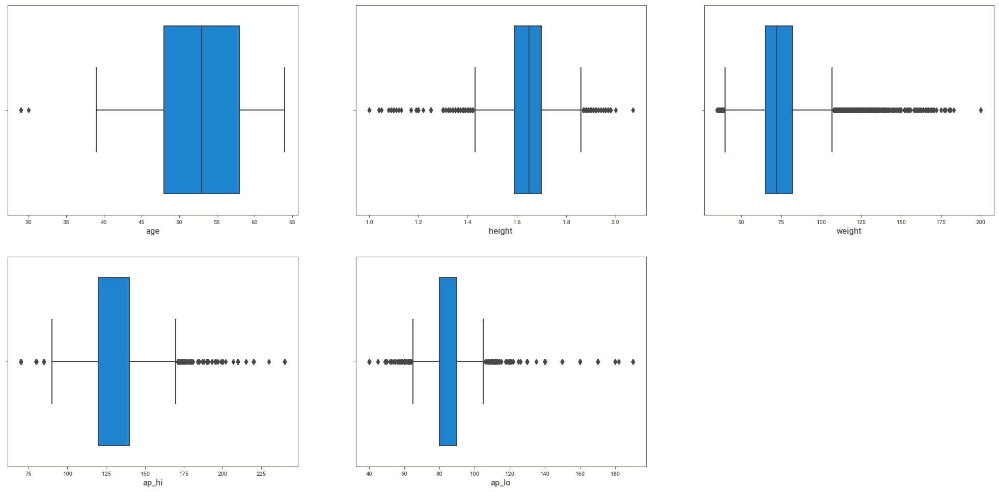

In [63]:
multiple_boxplots(df1[['age', 'height', 'weight', 'ap_hi', 'ap_lo']], 2, 3);

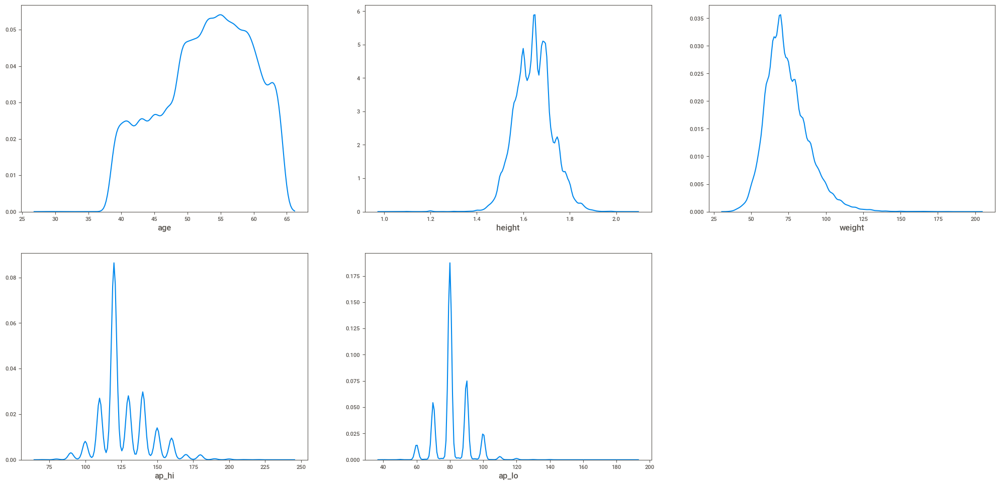

In [64]:
multiple_kdeplots(df1[['age', 'height', 'weight', 'ap_hi', 'ap_lo']], 2, 3);

### 1.7 Save State

In [65]:
df1.to_pickle(homepath + 'data/processed/df1.pkl')

## 2. FEATURE ENGINEERING

### 2.1 Load Checkpoint

In [66]:
df_total = pd.read_pickle(homepath + 'data/processed/df1.pkl')

# Train -> 70%
# Test -> 20%
# Validation -> 10%
x_train, x_test = train_test_split(df_total , test_size = 0.2, random_state = seed)

# if train = 80% x dataset, then val = 0.1/0.8 = 0.125
# 0.125 x 0.8 = 0.1
x_train, x_val = train_test_split(x_train, test_size = 0.125, random_state = seed)


#### 2.1.1 Split Data

In [67]:
# Train -> 70%
# Test -> 20%
# Validation -> 10%
x_train, x_test = train_test_split(df_total , test_size = 0.2, random_state = seed)

# if train = 80% x dataset, then val = 0.1/0.8 = 0.125
# 0.125 x 0.8 = 0.1
x_train, x_val = train_test_split(x_train, test_size = 0.125, random_state = seed)

### 2.2 Systolic and Diastolic Pressure

I noticed something interesting in the descriptive statistics, **some diastolic pressure values ​​are higher than systolic pressure values**. My theory is: In the construction of this database someone inserted the values ​​of these two columns swapped because the value of the systolic pressure is, by definition, greater than the diastolic pressure.

In [68]:
for dataframe in [x_train, x_test, x_val]:
    dataframe['pulse_pressure_range'] = dataframe['ap_hi'] - dataframe['ap_lo']
    
    dataframe['systolic_pressure'] = dataframe[['ap_hi', 'ap_lo', 'pulse_pressure_range']].apply(lambda x: x['ap_hi'] if x['pulse_pressure_range'] >= 0
                                                                                                else (x['ap_hi'] + (x['pulse_pressure_range']*(-1))), axis = 1)
    
    
    dataframe['diastolic_pressure'] = dataframe[['ap_hi', 'ap_lo', 'pulse_pressure_range']].apply(lambda x: x['ap_lo'] if x['pulse_pressure_range'] >= 0
                                                                                                else (x['ap_lo'] + (x['pulse_pressure_range'])), axis = 1)
    
    dataframe['pulse_pressure_range'] = dataframe['pulse_pressure_range'].apply(lambda x: x if x >= 0 else -x)

### 2.3 Blood Pressure

According to the American Heart Association, the ideal blood pressure range is 120/80 mm Hg. A person’s blood pressure is expressed in two values – 120 and 80 in the previous case. The first value is the systolic blood pressure, while the value after the slash ‘/’ symbol is the diastolic blood pressure.


- **Systolic blood pressure**: This unit indicates how much pressure blood exerts on the arterial walls when the heart beats at the time of measurement. This is when the heart pumps blood out of the heart and circulates it to various organs in the body.
- **Diastolic blood pressure**: This unit indicates how much pressure is exerted on the arterial walls when the heart rests between two beats. This is the period during which the heart opens its chamber to fill with blood.

In general, systolic blood pressure receives more medical attention. It is also an important risk factor for cardiovascular disease in older people. It is widely observed that systolic blood pressure increases steadily with age due to the increased stiffness of large arteries and plaque formation in the blood vessels.
Under normal circumstances, blood pressure approaching 300 is hazardous. In various health forums, individuals have reported having experienced blood pressure above 250. Most of these individuals have also reported suffering from extreme medical conditions, such as a heavy buzzing in the ears, uncontrollably intense headaches, dizziness, and even loss of consciousness.


[Reference](https://www.scienceabc.com/eyeopeners/how-high-can-a-blood-pressure-go.html)

A sudden fall in blood pressure can be dangerous. A change of just 20 mm Hg — a drop from 110 systolic to 90 mm Hg systolic, for example, can cause dizziness and fainting when the brain fails to receive enough blood. And big drops, such as those caused by uncontrolled bleeding, severe infections or allergic reactions, can be life-threatening.

[Reference](https://www.mayoclinic.org/diseases-conditions/low-blood-pressure/symptoms-causes/syc-20355465)

Blood pressure can be classified into four categories based on the readings from a sphygmomanometer:

- **Hypotension**: Systolic pressure reading lower than 90 and diastolic lower than 60;
- **Normal**: Systolic pressure reading between 90-120 and diastolic pressure reading between 60-80 is considered normal;
- **Pre-high blood pressure**: Systolic pressure reading between 120-140 and diastolic pressure reading between 80-90 is considered a slightly elevated level of blood pressure;
- **High blood pressure**: Systolic pressure reading between 140-180 and diastolic pressure reading between 90-100 is considered to be a high blood pressure condition;
- **Hypertensive crisis**: If one’s systolic pressure exceeds 180 or diastolic pressure crosses 100, it is a stage that requires immediate medical attention.

In [69]:
for dataframe in [x_train, x_test, x_val]:
    dataframe['blood_pressure'] = dataframe.apply(lambda x:  'hypotension' if (x['systolic_pressure'] < 90) and (x['diastolic_pressure'] < 60)
                                                    else 'normal' if (x['systolic_pressure'] >= 90 and x['systolic_pressure'] <= 120) and (x['diastolic_pressure'] >= 60 and x['diastolic_pressure'] <= 80)
                                                    else 'prehigh_blood_pressure' if (x['systolic_pressure'] > 120 and x['systolic_pressure'] <= 140) or (x['diastolic_pressure'] > 80 and x['diastolic_pressure'] <= 90) 
                                                    else 'high_blood_pressure' if (x['systolic_pressure'] > 140 and x['systolic_pressure'] <= 180) or (x['diastolic_pressure'] > 90 and x['diastolic_pressure'] <= 100)
                                                    else 'hypertensive_crisis' if (x['systolic_pressure'] > 180) and (x['diastolic_pressure'] > 100)
                                                    else 'need_an_analysis', axis = 1)

In [70]:
categorical_metrics(x_train, 'blood_pressure')

,absolute,percent %
normal,27274,55.916
prehigh_blood_pressure,17211,35.285
high_blood_pressure,4060,8.324
hypertensive_crisis,114,0.234
need_an_analysis,107,0.219
hypotension,11,0.023


In [71]:
categorical_metrics(x_test, 'blood_pressure')

,absolute,percent %
normal,7689,55.170
prehigh_blood_pressure,5024,36.048
high_blood_pressure,1161,8.330
need_an_analysis,33,0.237
hypertensive_crisis,29,0.208
hypotension,1,0.007


In [72]:
categorical_metrics(x_val, 'blood_pressure')

,absolute,percent %
normal,3822,54.843
prehigh_blood_pressure,2515,36.088
high_blood_pressure,602,8.638
need_an_analysis,15,0.215
hypertensive_crisis,14,0.201
hypotension,1,0.014


### 2.4 Pulse Pressure

A normal pulse pressure range is between 40 and 60 mm Hg, values ​​below 40 are considered low and above 60 high. Low pulse pressure can indicate decreased cardiac output. It’s often observed in people with heart failure.As people age, it’s common for their pulse pressure measurement to increase. This can be due to high blood pressure or atherosclerosis, fatty deposits that build up on your arteries. Additionally, iron deficiency anemia and hyperthyroidism can lead to an increase in pulse pressure.

[Reference](https://www.healthline.com/health/pulse-pressure#low-vs-normal-vs-high)

In [73]:
for dataframe in [x_train, x_test, x_val]:
    dataframe['pulse_pressure'] = dataframe['pulse_pressure_range'].apply(lambda x: 'low' if (x >= 0) and (x < 40) 
                                                                else 'normal' if (x >= 40) and (x < 60)
                                                                else 'high')

In [74]:
categorical_metrics(x_train, 'pulse_pressure')

,absolute,percent %
normal,35540,72.862
high,8173,16.756
low,5064,10.382


In [75]:
categorical_metrics(x_train, 'pulse_pressure')

,absolute,percent %
normal,35540,72.862
high,8173,16.756
low,5064,10.382


In [76]:
categorical_metrics(x_val, 'pulse_pressure')

,absolute,percent %
normal,5038,72.292
high,1212,17.391
low,719,10.317


### 2.5 BMI and Body Mass

The body mass index (BMI) is a measure that uses your height and weight to work out if your weight is healthy, it can be calculated with person’s weight in kilograms divided by the square of height in meters. A high or low BMI may be an indicator of poor diet, varying activity levels or high stress but normal bmi, alone, doesn't mean healthy.

The BMI result will fit into one of 5 bands:

| Underweight |         Normal        |      Overweight     |        Obese        | Extremely Obese |  
| ----------- | --------------------- | ------------------- | ------------------- | --------------- |
| Under 18.5  | Between 18.5 and 24.9 | Between 25 and 29.9 | Between 30 and 39.9 |    40 or over   |


Health problems associated with a BMI in the obesity include:

- type 2 diabetes;
- stroke;
- heart disease;
- high blood pressure.

Health problems associated with a BMI in the underweight:

- weakened immuned system;
- anaemia;
- palpitations.

[Reference](https://www.nhsinform.scot/healthy-living/food-and-nutrition/healthy-eating-and-weight-loss/understanding-your-health-and-weight-body-mass-index-bmi)

In [77]:
for dataframe in [x_train, x_test, x_val]:
    dataframe['bmi'] = round(dataframe['weight']/(dataframe['height']**2), 1)

    dataframe['body_mass'] = dataframe['bmi'].apply(lambda x: 'underweight' if (x < 18.5)
                                            else  'normal' if (x >= 18.5) and (x < 25)
                                            else  'overweight' if (x >= 25) and (x < 30)
                                            else  'obese' if (x >= 30) and (x < 40)
                                            else 'extremely_obese')

In [78]:
categorical_metrics(x_train, 'body_mass')

,absolute,percent %
overweight,17826,36.546
normal,17473,35.822
obese,11748,24.085
extremely_obese,1289,2.643
underweight,441,0.904


In [79]:
categorical_metrics(x_test, 'body_mass')

,absolute,percent %
overweight,5129,36.801
normal,5067,36.356
obese,3235,23.212
extremely_obese,391,2.805
underweight,115,0.825


In [80]:
categorical_metrics(x_val, 'body_mass')

,absolute,percent %
normal,2560,36.734
overweight,2496,35.816
obese,1673,24.006
extremely_obese,189,2.712
underweight,51,0.732


### 2.6 Period of Life

[Reference](https://courses.lumenlearning.com/wm-lifespandevelopment/chapter/periods-of-human-development/)

In [81]:
age_min = df_total['age'].min()
age_max = df_total['age'].max()

print(f'The smallest age in this dataset is {age_min} years.\nThe highest age in this dataset is {age_max} years.')

The smallest age in this dataset is 29 years.
The highest age in this dataset is 64 years.


In [82]:
for dataframe in [x_train, x_test, x_val]:
    dataframe['period_of_life'] = dataframe['age'].apply(lambda x: 'early_adulthood' if (x >= 29) and (x < 40)
                                                            else   'middle_adulthood')

In [83]:
categorical_metrics(x_train, 'period_of_life')

,absolute,percent %
middle_adulthood,47507,97.396
early_adulthood,1270,2.604


In [84]:
categorical_metrics(x_test, 'period_of_life')

,absolute,percent %
middle_adulthood,13602,97.596
early_adulthood,335,2.404


In [85]:
categorical_metrics(x_val, 'period_of_life')

,absolute,percent %
middle_adulthood,6796,97.518
early_adulthood,173,2.482


### 2.7 Drop Columns

In [86]:
for dataframe in [x_train, x_test, x_val]:
    dataframe.drop(columns = ['ap_hi', 'ap_lo', 'pulse_pressure_range'], inplace = True)

### 2.8 Save State

In [87]:
df2 = pd.concat([x_train, x_test, x_val], ignore_index = True)

In [88]:
df2.to_pickle(homepath + 'data/processed/df2.pkl')
x_train.to_pickle(homepath + 'data/processed/x_train.pkl')
x_test.to_pickle(homepath + 'data/processed/x_test.pkl')
x_val.to_pickle(homepath + 'data/processed/x_val.pkl')

## 3. EXPLORATORY DATA ANALYSIS

### 3.1 Load Checkpoint

In [89]:
df3 = pd.read_pickle(homepath + 'data/processed/df2.pkl')

### 3.2 Mind Map

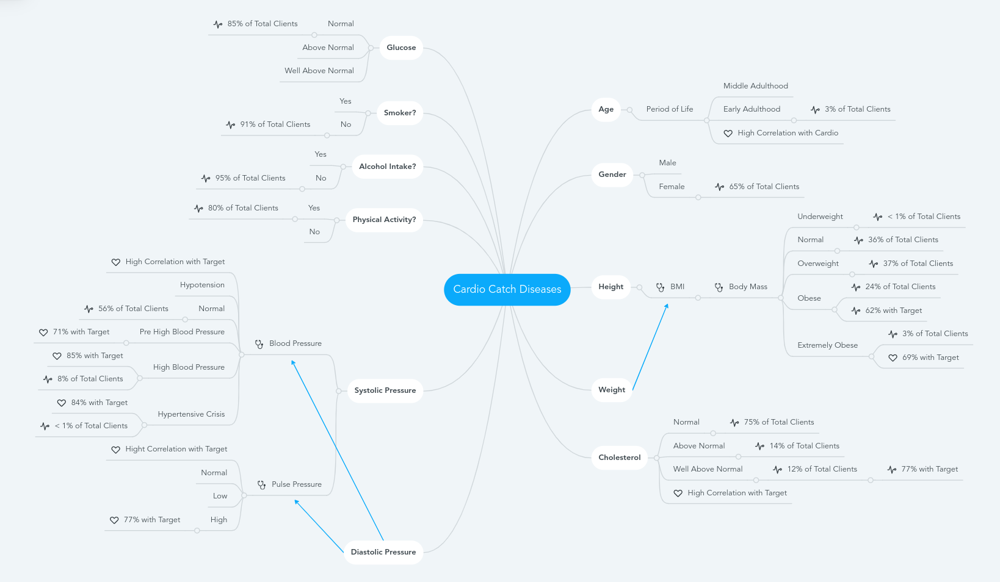

In [90]:
Image(homepath + 'reports/figures/mindmap.png')

### 3.3 Dataframe for EDA

In [91]:
df3 = cat_convert(df3)
df3.drop(columns = 'id', inplace = True)

In [92]:
df3.head()

,age,gender,height,weight,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio,systolic_pressure,diastolic_pressure,blood_pressure,pulse_pressure,bmi,body_mass,period_of_life,cardio_result
0,63,woman,1.740,85.000,normal,normal,no,no,no,1,110.000,70.000,normal,normal,28.100,overweight,middle_adulthood,yes
1,55,woman,1.550,84.000,normal,normal,no,no,yes,0,120.000,80.000,normal,normal,35.000,obese,middle_adulthood,no
2,64,man,1.780,81.000,normal,normal,yes,yes,yes,1,120.000,80.000,normal,normal,25.600,overweight,middle_adulthood,yes
3,57,woman,1.570,63.000,well above normal,normal,no,no,yes,1,140.000,90.000,prehigh_blood_pressure,normal,25.600,overweight,middle_adulthood,yes
4,45,woman,1.660,62.000,normal,normal,no,no,yes,0,120.000,85.000,prehigh_blood_pressure,low,22.500,normal,middle_adulthood,no


### 3.4 EDA Report

                                             |          | [  0%]   00:00 -> (? left)


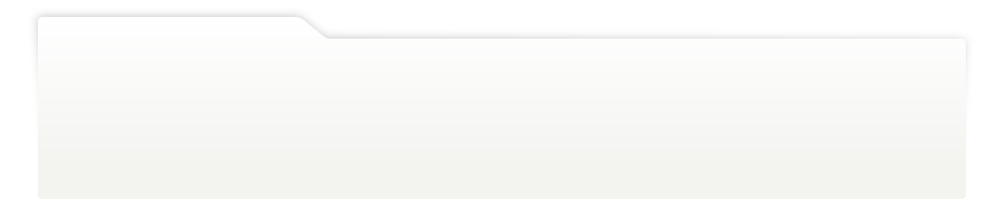
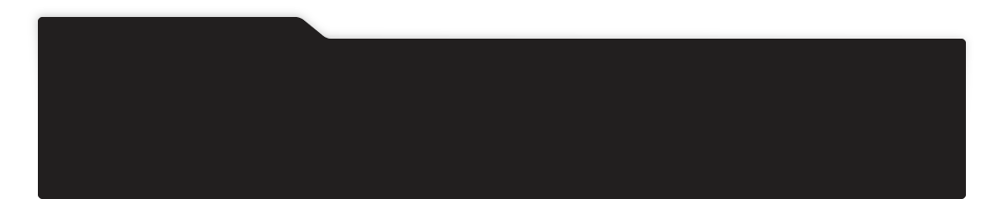
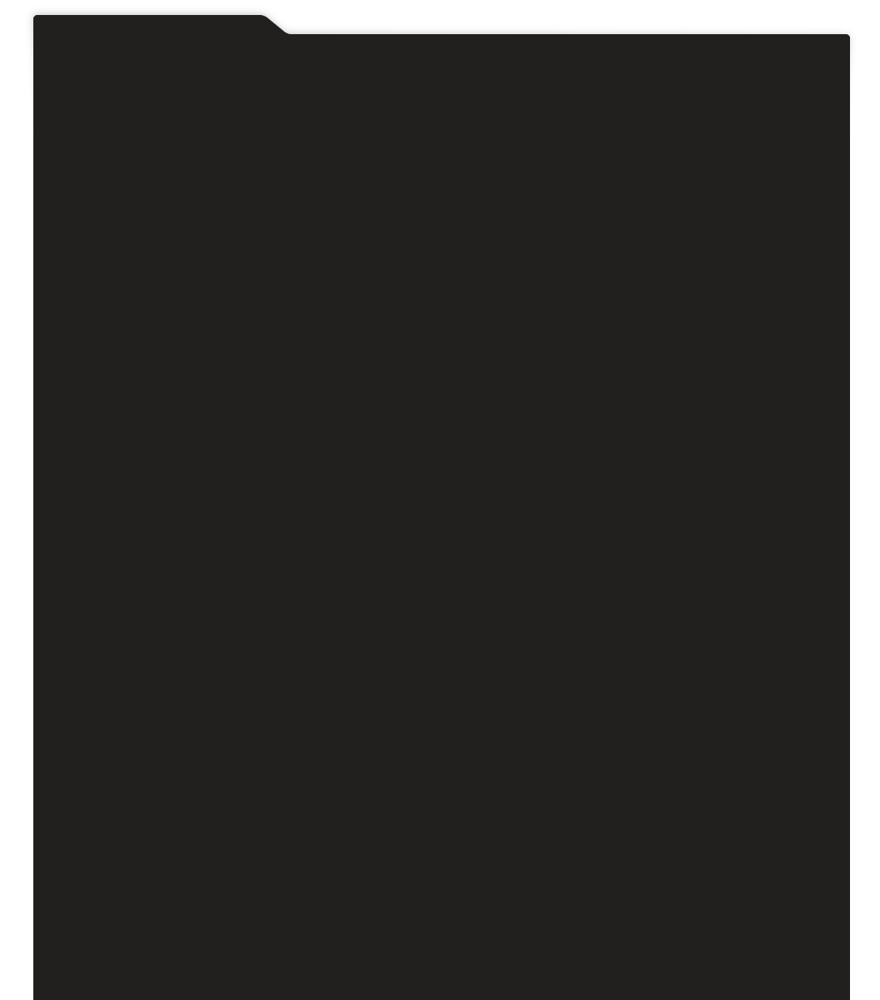
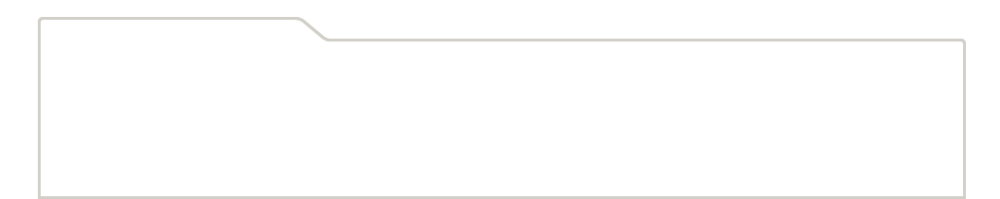
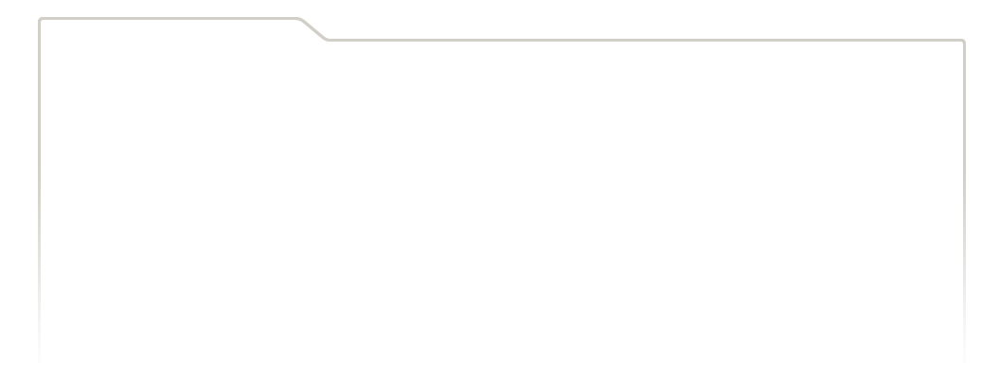
...
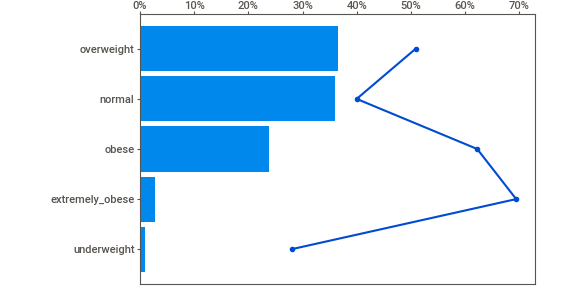
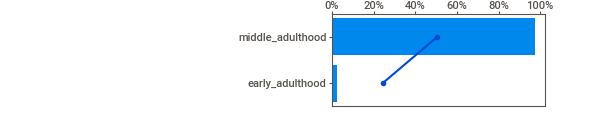
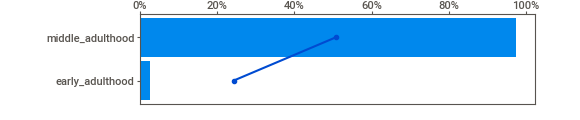
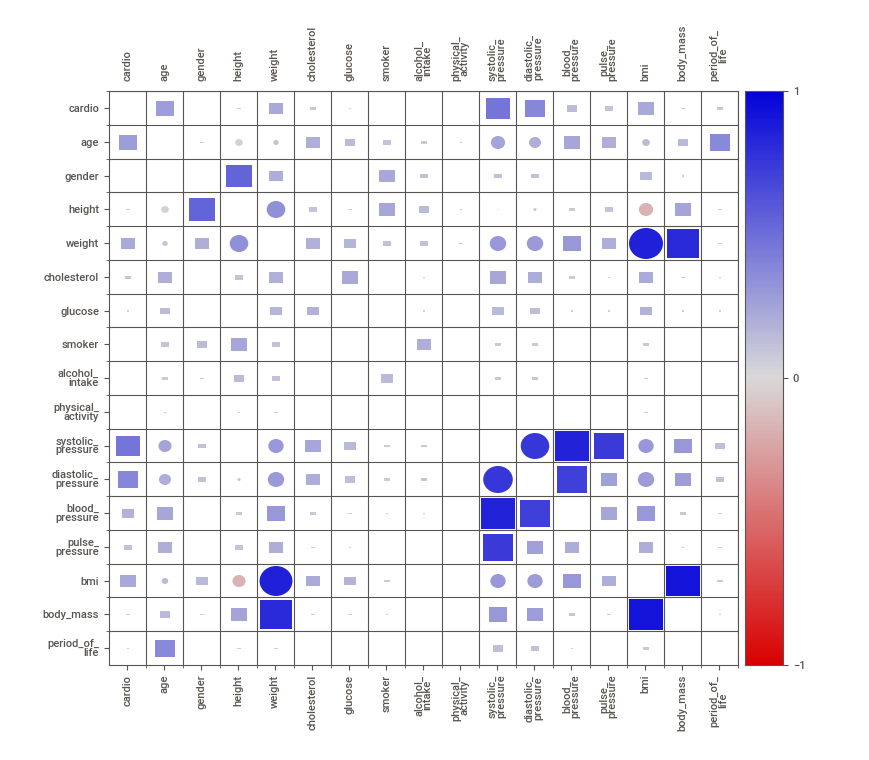
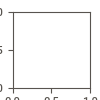

In [93]:
feature_config = sv.FeatureConfig(skip = 'id', force_cat = ['gender', 'cholesterol', 'glucose', 'smoker', 'alcohol_intake', 'physical_activity', 'blood_pressure', 'body_mass', 'period_of_life'])
report_2 = sv.analyze([df2, 'Cardio Catch Diseases'], 'cardio', feature_config)

report_2.show_notebook(layout = 'vertical', scale = 0.9)

### 3.5 Univariate Analysis

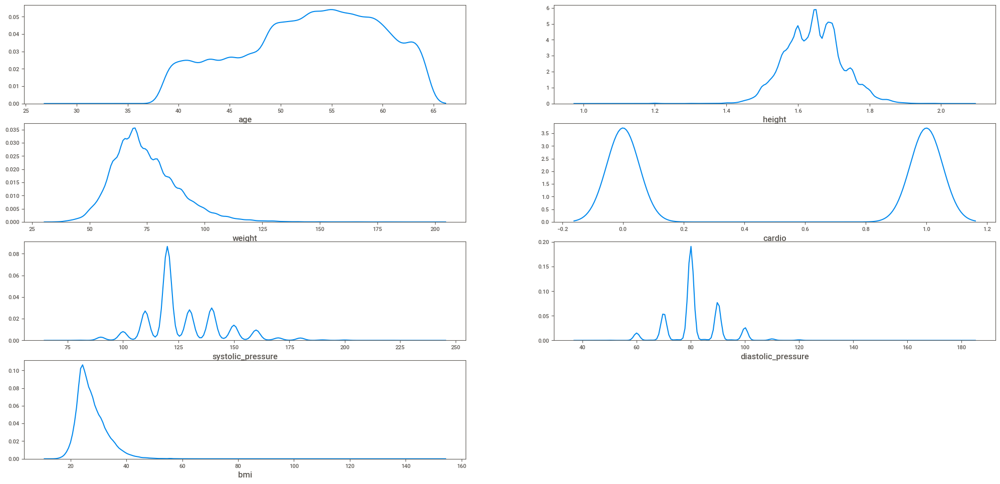

In [94]:
univariate_numerical = df3.select_dtypes(include = ['int64', 'float64'])
multiple_kdeplots(univariate_numerical, 4, 2);

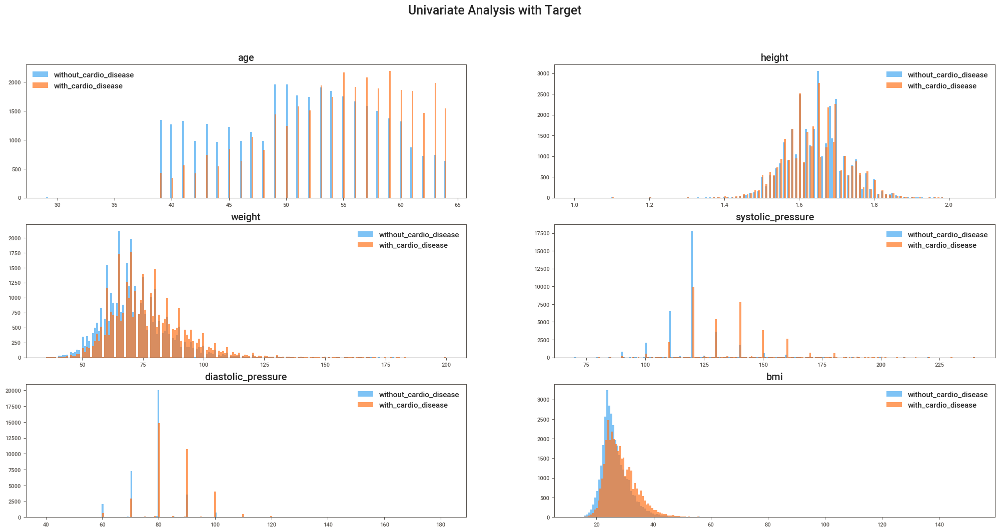

In [95]:
# creating two datasets, one with cardio disease and other without hue
with_cardio_disease = univariate_numerical[univariate_numerical['cardio'] == 1]
without_cardio_disease = univariate_numerical[univariate_numerical['cardio'] == 0]

# creating subplots
fig, ax = plt.subplots(3, 2)

plot_with_target(without_cardio_disease, with_cardio_disease,
                 'age', 0, 0, 'without_cardio_disease', 'with_cardio_disease');

plot_with_target(without_cardio_disease, with_cardio_disease,
                 'height', 0, 1, 'without_cardio_disease', 'with_cardio_disease');

plot_with_target(without_cardio_disease, with_cardio_disease,
                 'weight', 1, 0, 'without_cardio_disease', 'with_cardio_disease');

plot_with_target(without_cardio_disease, with_cardio_disease,
                 'systolic_pressure', 1, 1, 'without_cardio_disease', 'with_cardio_disease');

plot_with_target(without_cardio_disease, with_cardio_disease,
                 'diastolic_pressure', 2, 0, 'without_cardio_disease', 'with_cardio_disease');

plot_with_target(without_cardio_disease, with_cardio_disease,
                 'bmi', 2, 1, 'without_cardio_disease', 'with_cardio_disease');
fig.suptitle('Univariate Analysis with Target', fontsize = 18);

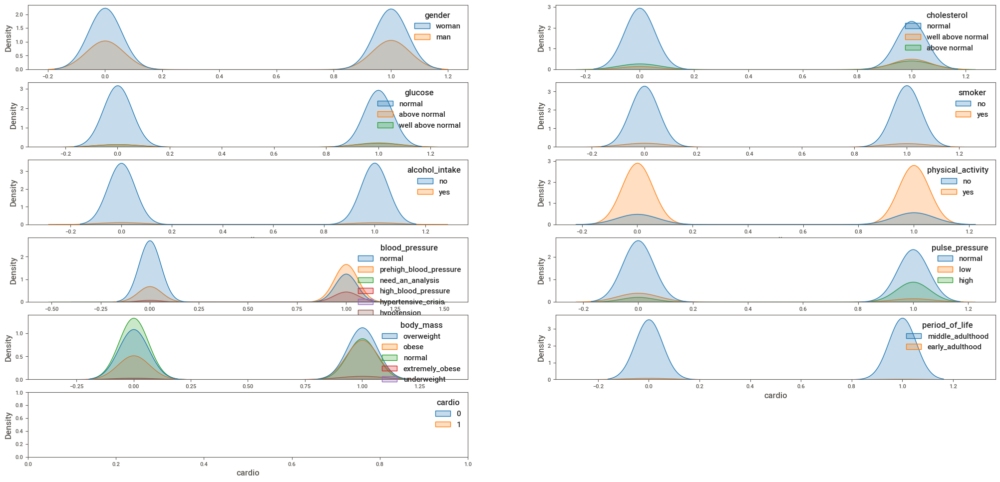

In [96]:
cat_target = df3[['gender', 'cholesterol', 'glucose', 'smoker', 'alcohol_intake', 'physical_activity', 'blood_pressure', 'pulse_pressure', 'body_mass',
                    'period_of_life', 'cardio']]
kdeplots_cat(cat_target, 6, 2, 'cardio');

### 3.6 Bivariate Analysis

#### 3.6.1 Pairplot

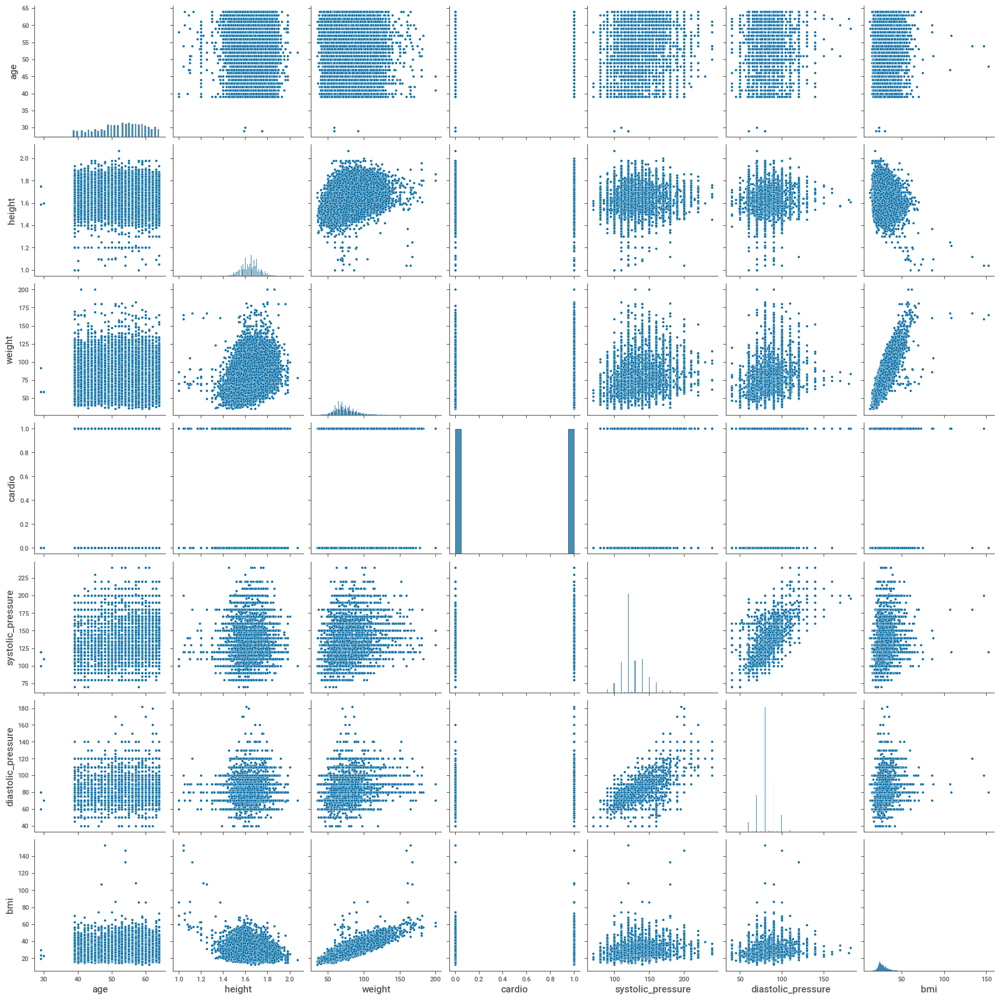

In [97]:
sns.pairplot(df3);

#### 3.6.2 H1- Both genders have the same proportion of cardiovascular disease.
**True** In proportion, the results are similar

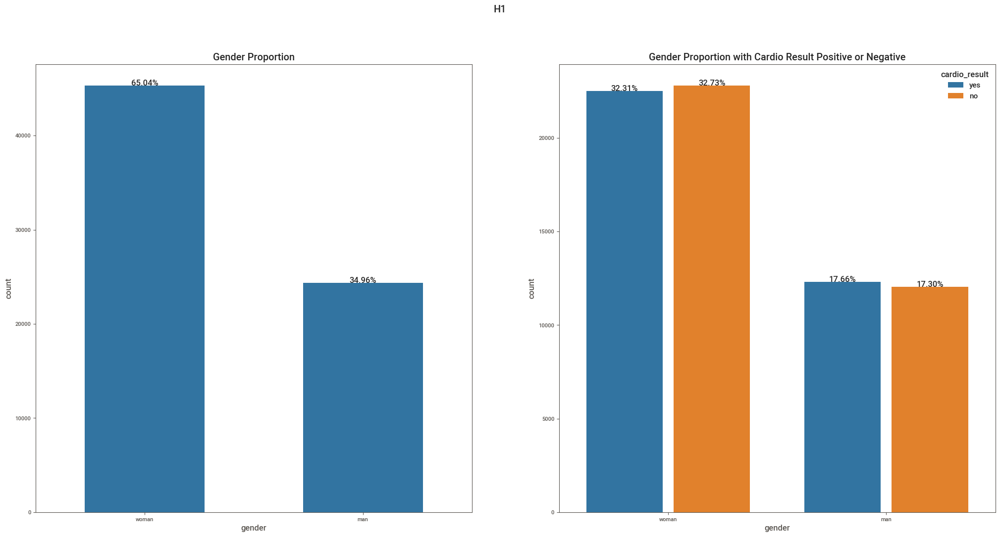

In [98]:
# creating subplots
fig, ax = plt.subplots()
fig.suptitle('H1')

plt.subplot(1, 2, 1)
ax = sns.countplot(data = df3, x = 'gender', palette = ['#1F77B4', '#1F77B4'])
ax.set_title('Gender Proportion')
percentage(ax, df3)
change_width(ax, .55)


plt.subplot(1, 2, 2)
ax2 = sns.countplot(data = df3, x = 'gender', hue = 'cardio_result', palette = 'tab10')
ax2.set_title('Gender Proportion with Cardio Result Positive or Negative')
percentage(ax2, df3)
change_width(ax2, .35)


In [99]:
print(f'Woman: {round(3231/65.04, 2)}% \nMan: {round(1766/34.96, 2)}%')

Woman: 49.68% 
Man: 50.51%



#### 3.6.3 H2- Obese and people are 70% or more likely to develop cardiovascular disease.
**False** Obese people are 62.26% likely to develop cardiovascular disease

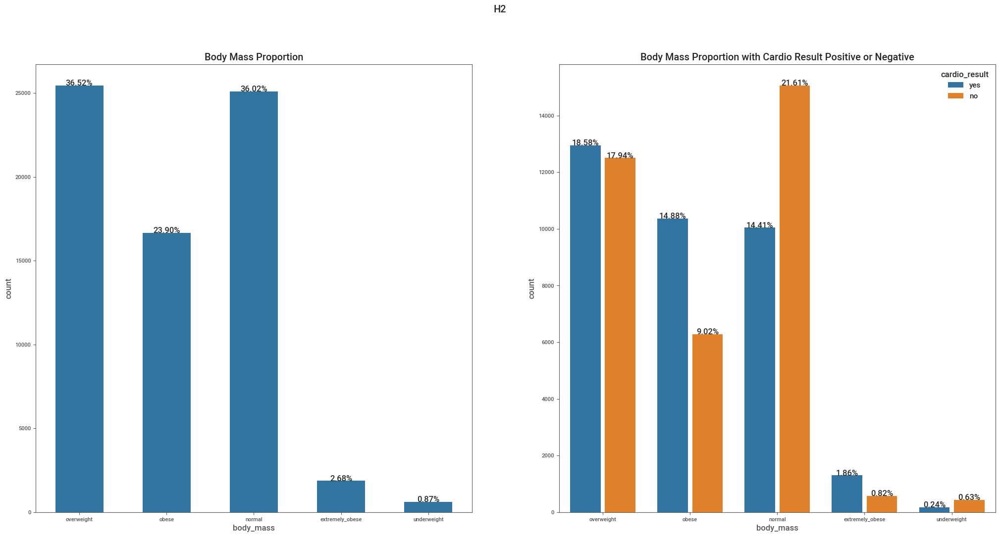

In [100]:
# creating subplots
fig, ax = plt.subplots()
fig.suptitle('H2')

plt.subplot(1, 2, 1)
ax = sns.countplot(data = df3, x = 'body_mass', palette = ['#1F77B4', '#1F77B4'])
ax.set_title('Body Mass Proportion')
percentage(ax, df3)
change_width(ax, .55)

plt.subplot(1, 2, 2)
ax = sns.countplot(data = df3, x = 'body_mass', hue = 'cardio_result', palette = 'tab10')
ax.set_title('Body Mass Proportion with Cardio Result Positive or Negative')
percentage(ax, df3)
change_width(ax, .35)

In [101]:
print(f'Obese: {round(1488/23.9, 2)}% \nNormal: {round(1441/36.02, 2)}% \nUnderweight: {round(24/0.87, 2)}%')

Obese: 62.26% 
Normal: 40.01% 
Underweight: 27.59%


#### 3.6.4 H3- People who do not practice physical activity have an 80% chance of having high cholesterol.
**False** Not even close, just 18.18% of people who don't practice physical activity have a cholesterol well above normal

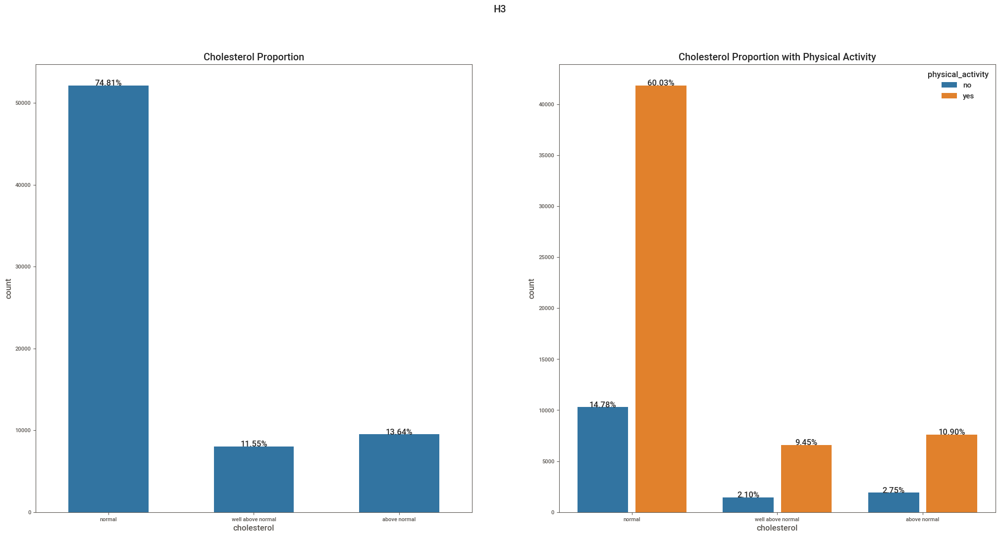

In [102]:
# creating subplots
fig, ax = plt.subplots()
fig.suptitle('H3')

plt.subplot(1, 2, 1)
ax = sns.countplot(data = df3, x = 'cholesterol', palette = ['#1F77B4', '#1F77B4'])
ax.set_title('Cholesterol Proportion')
percentage(ax, df3)
change_width(ax, .55)


plt.subplot(1, 2, 2)
ax2 = sns.countplot(data = df3, x = 'cholesterol', hue = 'physical_activity', palette = 'tab10')
ax2.set_title('Cholesterol Proportion with Physical Activity')
percentage(ax2, df3)
change_width(ax2, .35)

In [103]:
print(f'Normal: {round(1478/74.81, 2)}% \nAbove normal: {round(275/13.64, 2)}% \nWell above normal: {round(210/11.55, 2)}% ')

Normal: 19.76% 
Above normal: 20.16% 
Well above normal: 18.18% 


#### 3.6.5 H4- People over 50 are twice as likely to have cardiovascular disease as not have any.
**False** This value is only reached after 61 years 

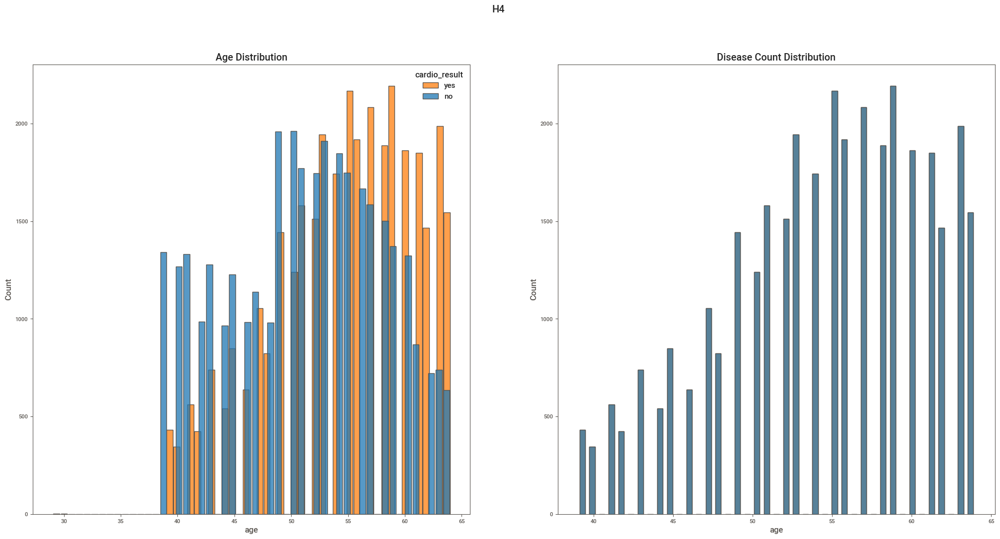

In [104]:
# creating subplots
fig, ax = plt.subplots()
fig.suptitle('H4')

plt.subplot(1, 2, 1)
ax = sns.histplot(df3[df3['cardio_result'] == 'yes']['age'], label = 'yes', color = '#FF7F0E')
ax = sns.histplot(df3[df3['cardio_result'] == 'no']['age'], label = 'no', color = '#1F77B4')
plt.legend(['yes', 'no'], title = 'cardio_result')
ax.set_title('Age Distribution')
change_width(ax, .55)


plt.subplot(1, 2, 2)
ax2 = sns.histplot(df3[df3['cardio_result'] == 'yes']['age'], color = '#FF7F0E')
ax2 = sns.histplot(df3[df3['cardio_result'] == 'yes']['age'], color = '#1F77B4')
ax2.set_title('Disease Count Distribution')
change_width(ax2, .35)

#### 3.6.6 H5- People with high blood pressure have a 80% chance of having a cardiovascular disease.
**True** People with high blood pressure have 84.93% change of having a cardiovascular disease

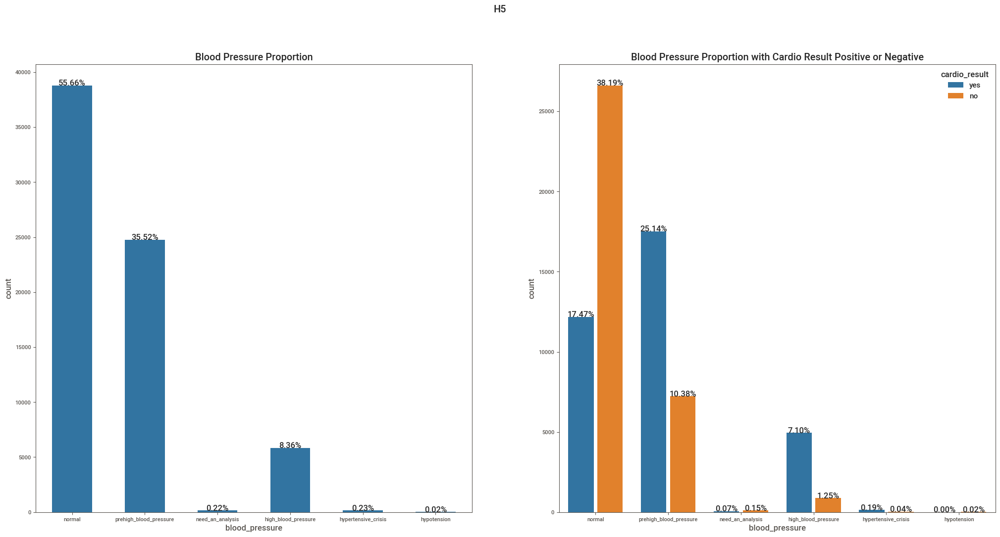

In [105]:
# creating subplots
fig, ax = plt.subplots()
fig.suptitle('H5')

plt.subplot(1, 2, 1)
ax = sns.countplot(data = df3, x = 'blood_pressure', palette = ['#1F77B4', '#1F77B4'])
ax.set_title('Blood Pressure Proportion')
percentage(ax, df3)
change_width(ax, .55)


plt.subplot(1, 2, 2)
ax2 = sns.countplot(data = df3, x = 'blood_pressure', hue = 'cardio_result', palette = 'tab10')
ax2.set_title('Blood Pressure Proportion with Cardio Result Positive or Negative')
percentage(ax2, df3)
change_width(ax2, .35)

In [106]:
print(f'High Blood Pressure: {round(710/8.36, 2)}%')

High Blood Pressure: 84.93%


#### 3.6.7 H6- People who smoke are just as likely to have cardiovascular disease as non-smokers.
**False** However, the difference is only 3% 

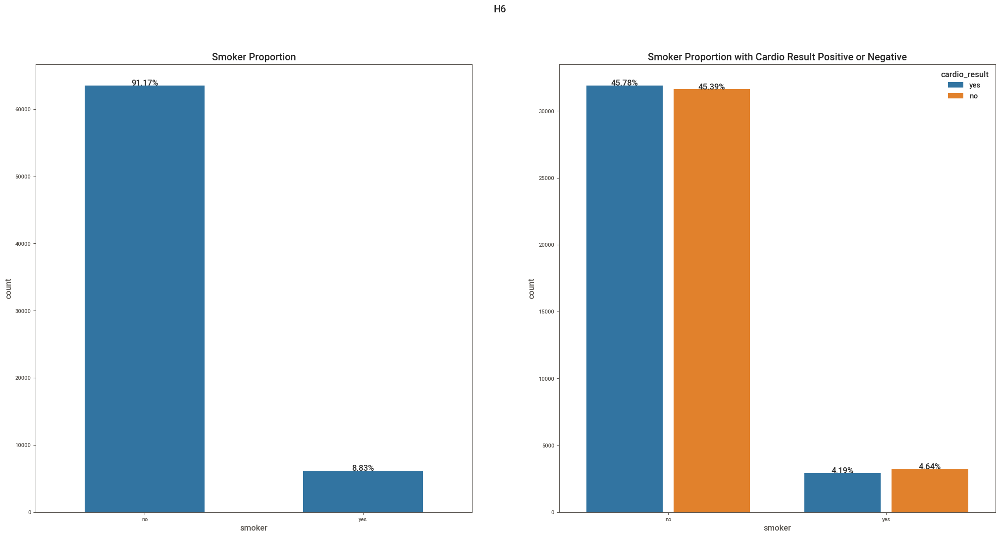

In [107]:
# creating subplots
fig, ax = plt.subplots()
fig.suptitle('H6')

plt.subplot(1, 2, 1)
ax = sns.countplot(data = df3, x = 'smoker', palette = ['#1F77B4', '#1F77B4'])
ax.set_title('Smoker Proportion')
percentage(ax, df3)
change_width(ax, .55)


plt.subplot(1, 2, 2)
ax2 = sns.countplot(data = df3, x = 'smoker', hue = 'cardio_result', palette = 'tab10')
ax2.set_title('Smoker Proportion with Cardio Result Positive or Negative')
percentage(ax2, df3)
change_width(ax2, .35)

In [108]:
print(f'Smoker: {round(419/8.83, 2)}% \nNot smoker: {round(4578/91.17, 2)}%')

Smoker: 47.45% 
Not smoker: 50.21%


#### 3.6.8 H7- People with a high pulse pressure have a 80% chance of having a cardiovascular disease.
**True** People with a high pulse pressure have a 80.75% chance of having a cardiovascular disease.  

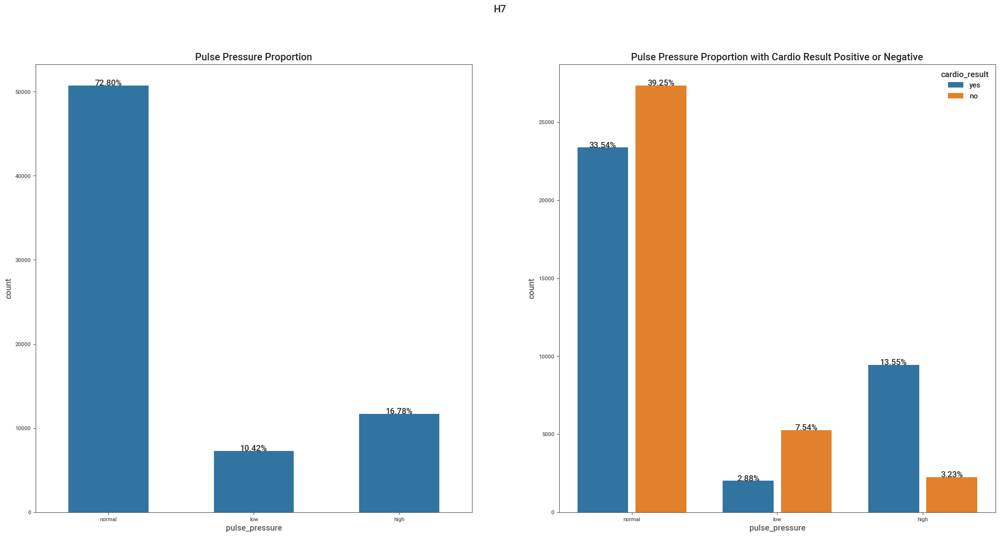

In [109]:
# creating subplots
fig, ax = plt.subplots()
fig.suptitle('H7')

plt.subplot(1, 2, 1)
ax = sns.countplot(data = df3, x = 'pulse_pressure', palette = ['#1F77B4', '#1F77B4'])
ax.set_title('Pulse Pressure Proportion')
percentage(ax, df3)
change_width(ax, .55)


plt.subplot(1, 2, 2)
ax2 = sns.countplot(data = df3, x = 'pulse_pressure', hue = 'cardio_result', palette = 'tab10')
ax2.set_title('Pulse Pressure Proportion with Cardio Result Positive or Negative')
percentage(ax2, df3)
change_width(ax2, .35)

In [110]:
print(f'High pulse pressure: {round(1355/16.78, 2)}%')

High pulse pressure: 80.75%


#### 3.6.9 H8- People with alcohol intake have a 70% chance of having cardiovascular disease.
**True** People who consumes alcohol has a 48.33% chance

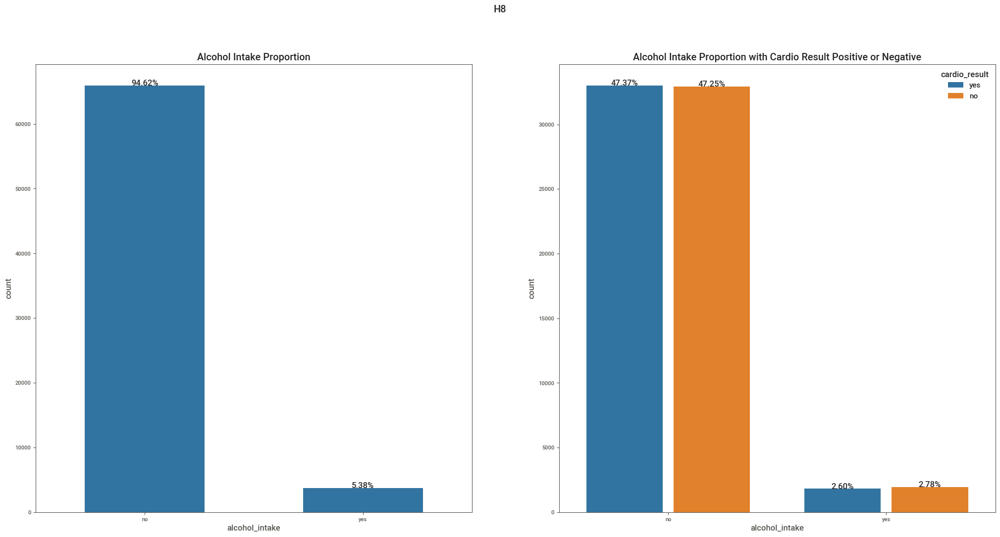

In [111]:
# creating subplots
fig, ax = plt.subplots()
fig.suptitle('H8')

plt.subplot(1, 2, 1)
ax = sns.countplot(data = df3, x = 'alcohol_intake', palette = ['#1F77B4', '#1F77B4'])
ax.set_title('Alcohol Intake Proportion')
percentage(ax, df3)
change_width(ax, .55)


plt.subplot(1, 2, 2)
ax2 = sns.countplot(data = df3, x = 'alcohol_intake', hue = 'cardio_result', palette = 'tab10')
ax2.set_title('Alcohol Intake Proportion with Cardio Result Positive or Negative')
percentage(ax2, df3)
change_width(ax2, .35)

In [112]:
print(f'Alcohol intake: {round(260/5.38, 2)}%')

Alcohol intake: 48.33%


In [113]:
df3.head()

,age,gender,height,weight,cholesterol,glucose,smoker,alcohol_intake,physical_activity,cardio,systolic_pressure,diastolic_pressure,blood_pressure,pulse_pressure,bmi,body_mass,period_of_life,cardio_result
0,63,woman,1.740,85.000,normal,normal,no,no,no,1,110.000,70.000,normal,normal,28.100,overweight,middle_adulthood,yes
1,55,woman,1.550,84.000,normal,normal,no,no,yes,0,120.000,80.000,normal,normal,35.000,obese,middle_adulthood,no
2,64,man,1.780,81.000,normal,normal,yes,yes,yes,1,120.000,80.000,normal,normal,25.600,overweight,middle_adulthood,yes
3,57,woman,1.570,63.000,well above normal,normal,no,no,yes,1,140.000,90.000,prehigh_blood_pressure,normal,25.600,overweight,middle_adulthood,yes
4,45,woman,1.660,62.000,normal,normal,no,no,yes,0,120.000,85.000,prehigh_blood_pressure,low,22.500,normal,middle_adulthood,no


### 3.7 Multivariate Analysis

#### 3.7.1 Numerical Features

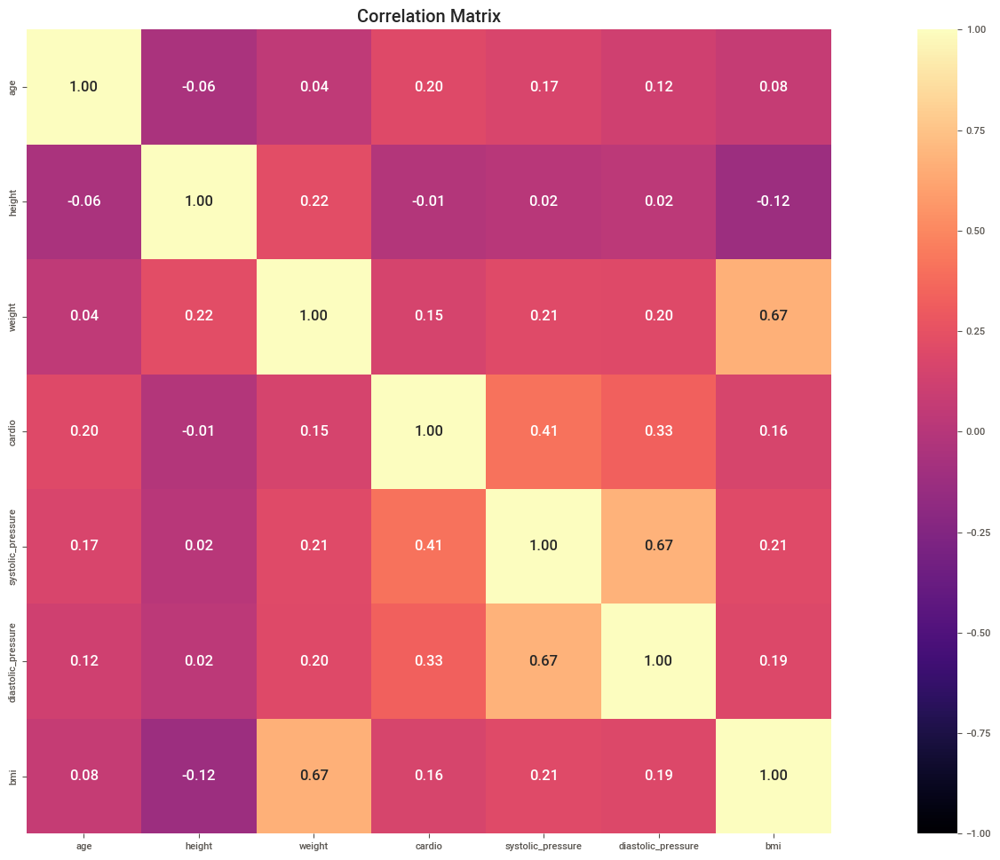

In [114]:
correlation_matrix(df3, 'kendall');

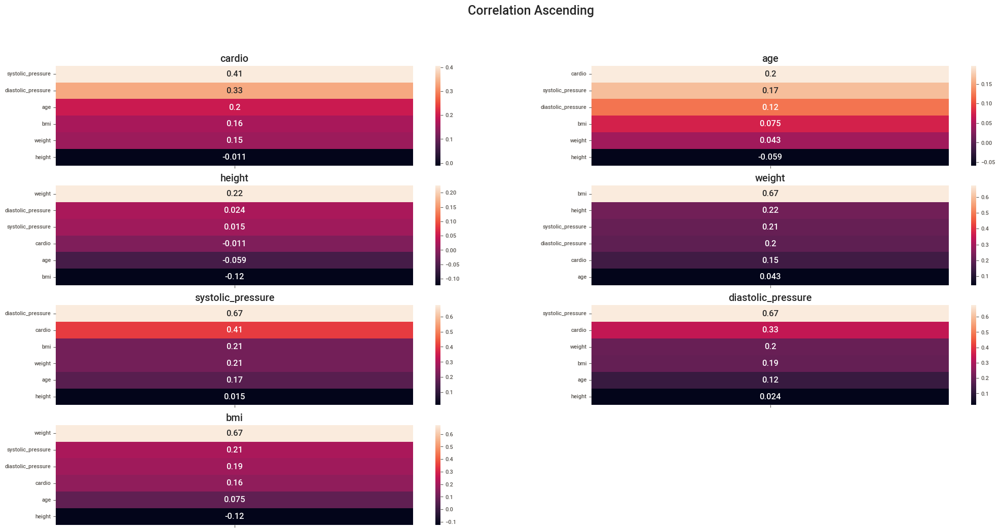

In [115]:
# creating subplots
fig, ax = plt.subplots()

plt.subplot(4, 2, 1)
correlation_ascending(df3, 'cardio', 'kendall');

plt.subplot(4, 2, 2)
correlation_ascending(df3, 'age', 'kendall');

plt.subplot(4, 2, 3)
correlation_ascending(df3, 'height', 'kendall');

plt.subplot(4, 2, 4)
correlation_ascending(df3, 'weight', 'kendall');

plt.subplot(4, 2, 5)
correlation_ascending(df3, 'systolic_pressure', 'kendall');

plt.subplot(4, 2, 6)
correlation_ascending(df3, 'diastolic_pressure', 'kendall');

plt.subplot(4, 2, 7)
correlation_ascending(df3, 'bmi', 'kendall');
fig.suptitle('Correlation Ascending', fontsize = 18);

#### 3.7.2 Categorical Features

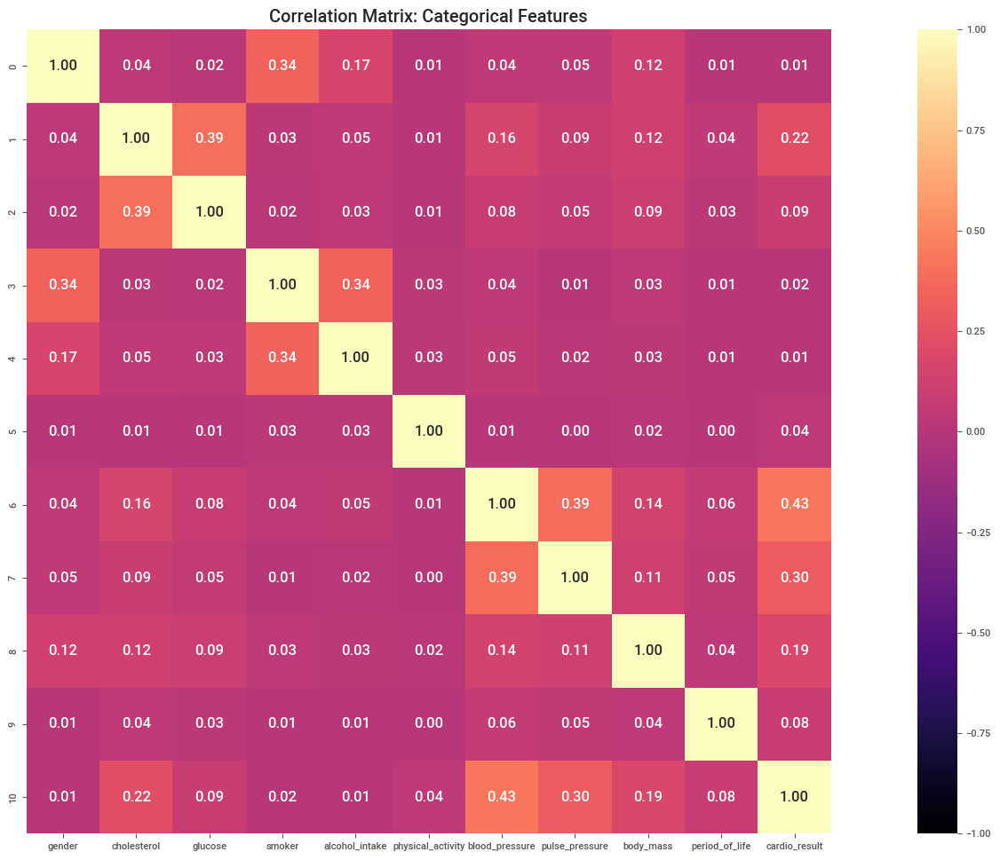

In [116]:
corr_cat(df3);

### 3.8 Conclusion

In view of all the analyzes carried out, the most relevant features were: **Age, Cholesterol, Systolic Pressure, Diastolic Pressure, Blood Pressure, Pulse Pressure, BMI and Body Mass**.

We know that health problems are multifactorial, that is, all the data collected are relevant, however, in the EDA some characteristics did not demonstrate the same impact as the selected ones.

## 4. DATA PREPARATION

### 4.1 Load Checkpoint

In [117]:
x_train = pd.read_pickle(homepath + 'data/processed/x_train.pkl')
x_test =  pd.read_pickle(homepath + 'data/processed/x_test.pkl')
x_val = pd.read_pickle(homepath + 'data/processed/x_val.pkl')

### 4.2 Encoding

In [118]:
# Ordinal Encoding
bp_encoding = {'need_an_analysis': 0, 'hypotension': 1, 'normal': 2, 'prehigh_blood_pressure': 3, 'high_blood_pressure': 4, 'hypertensive_crisis': 5}
pp_encoding = {'measurement_error': 0, 'low': 1, 'normal': 2, 'high': 3}
bm_encoding = {'underweight': 1, 'normal': 2, 'overweight': 3, 'obese': 4, 'extremely_obese': 5}
pl_encoding = {'early_adulthood': 1, 'middle_adulthood': 2}

# One Hot Encoding
x_train, x_test, x_val = [pd.get_dummies(dataframe, prefix = ['gender'], columns = ['gender']) for dataframe in [x_train, x_test, x_val]]



for dataframe in [x_train, x_test, x_val]:
    dataframe['blood_pressure'] = dataframe['blood_pressure'].map(bp_encoding)
    dataframe['pulse_pressure'] = dataframe['pulse_pressure'].map(pp_encoding)
    dataframe['body_mass'] = dataframe['body_mass'].map(bm_encoding)
    dataframe['period_of_life'] = dataframe['period_of_life'].map(pl_encoding)

### 4.3 Rescaling

In [119]:
num_attributes = df3[['age', 'height', 'weight', 'systolic_pressure', 'diastolic_pressure', 'bmi']]

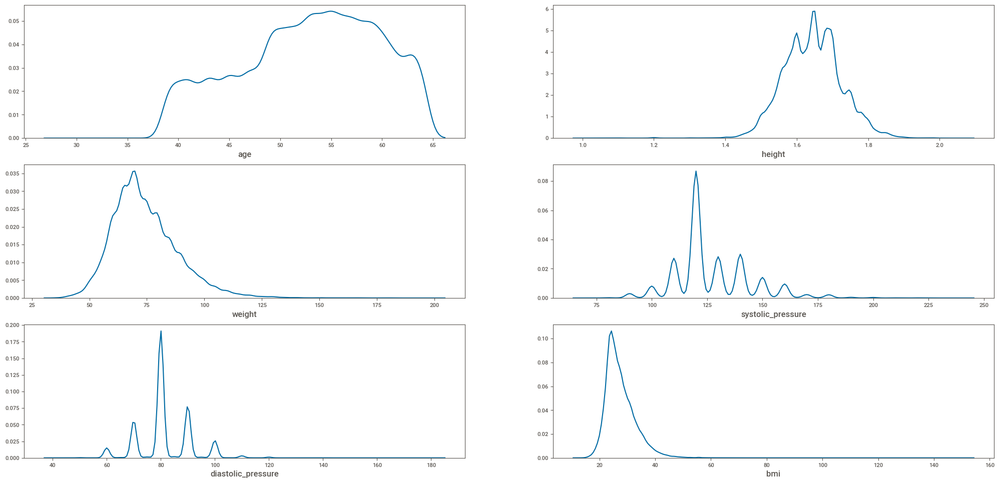

In [120]:
multiple_kdeplots(num_attributes, 3, 2);

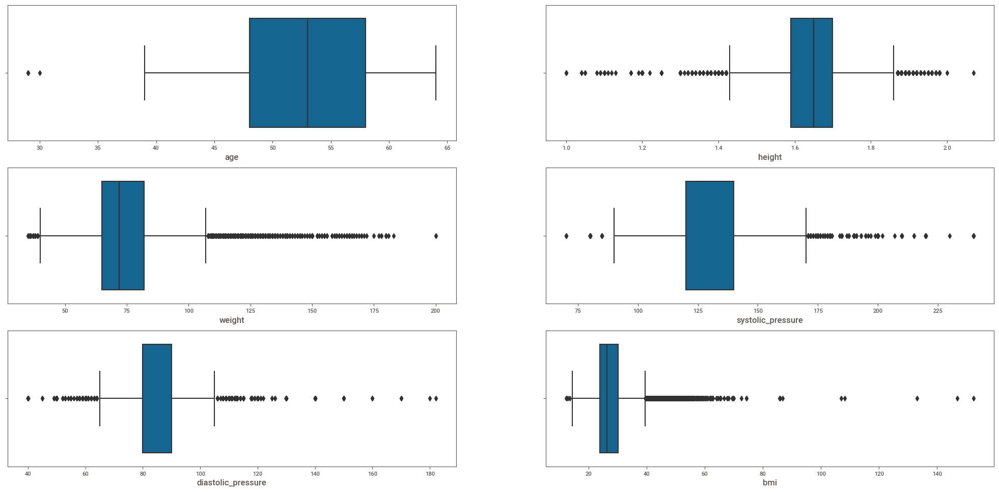

In [121]:
multiple_boxplots(num_attributes, 3, 2);

1. Without Outlier and With Normal Distribution: Standard Scaler (Mean and std deviation)
2. With Outliers and Normal Distribution: Robust Scaler (Quartile)
3. Without Normal Distribution: MinMax Scaler

In [122]:
# scaler
mms = MinMaxScaler()
rs = RobustScaler()

min_max_scaler = ['age', 'height', 'systolic_pressure', 'diastolic_pressure', 'bmi']
robust_scaler = ['weight']

for col in min_max_scaler:
    pickle.dump(mms, open(homepath + f'src/features/{col}_scaler.pkl', 'wb'))
    for dataframe in [x_train, x_test, x_val]:
        dataframe[[col]] = mms.fit_transform(dataframe[[col]].values)

for col in robust_scaler:
    pickle.dump(rs, open(homepath + f'src/features/{col}_scaler.pkl', 'wb'))
    for dataframe in [x_train, x_test, x_val]:
        dataframe[[col]] = rs.fit_transform(dataframe[[col]].values)

### 4.4 Split X and y

In [123]:
# target: cardio
y_train, y_test, y_val = [dataframe['cardio'] for dataframe in [x_train, x_test, x_val]]
ids_train, ids_test, ids_val = [dataframe['id'] for dataframe in [x_train, x_test, x_val]]
X_train, X_test, X_val = [dataframe.drop(columns = ['cardio', 'id']) for dataframe in [x_train, x_test, x_val]]

### 4.5 Feature Importance

#### 4.5.1 Feature Importance with ExtraTrees

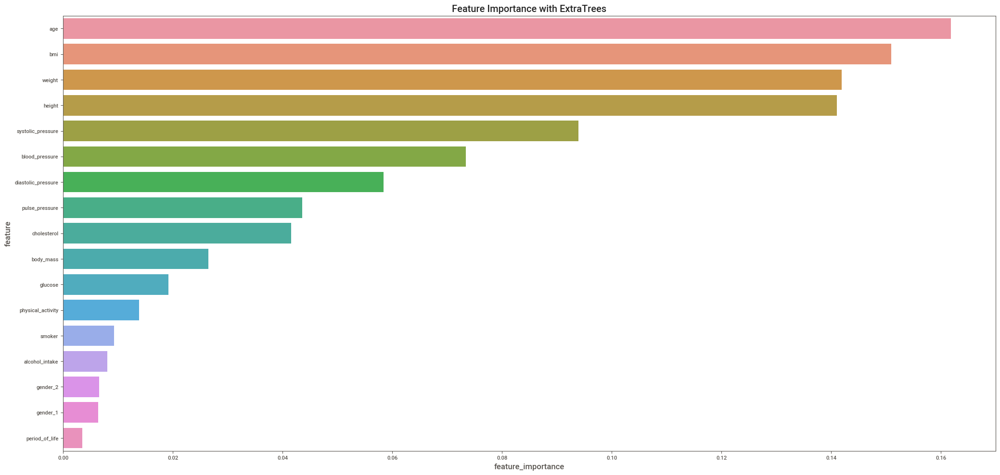

In [124]:
et_importance = ExtraTreesClassifier(n_estimators = 100, random_state = seed, n_jobs = 6)
et_importance.fit(X_train, y_train)

# feature importance dataframe
feature_selection = pd.DataFrame({'feature': X_train.columns,'feature_importance': et_importance.feature_importances_})\
                                .sort_values('feature_importance', ascending = False).reset_index(drop = True)

# plot feature importance
ax = sns.barplot(x = 'feature_importance', y = 'feature', data = feature_selection, orient = 'h')
ax.set_title('Feature Importance with ExtraTrees');

#### 4.5.2 Feature Importance with RandomForest

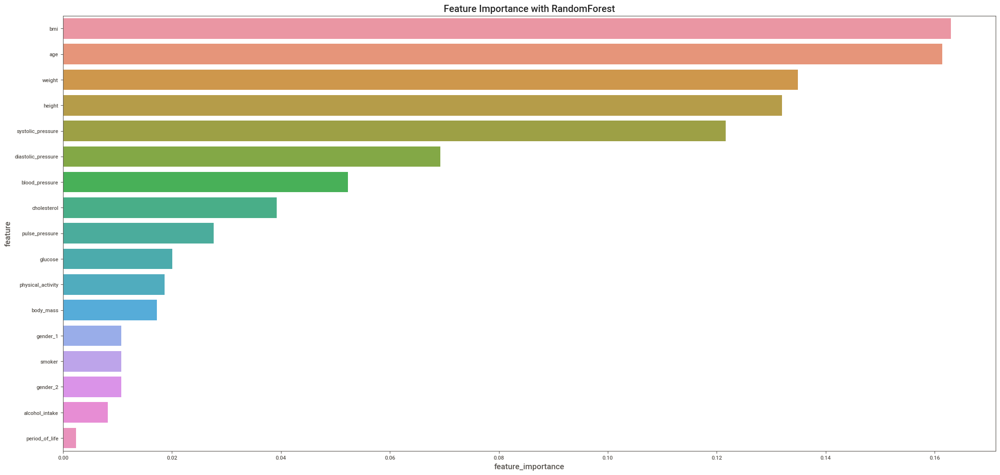

In [125]:
rf_importance = RandomForestClassifier(n_estimators = 100, random_state = seed, n_jobs = 6)
rf_importance.fit(X_train, y_train)

# feature importance dataframe
feature_selection = pd.DataFrame({'feature': X_train.columns,'feature_importance': rf_importance.feature_importances_})\
                                .sort_values('feature_importance', ascending = False).reset_index(drop = True)

# plot feature importance
ax = sns.barplot(x = 'feature_importance', y = 'feature', data = feature_selection, orient = 'h')
ax.set_title('Feature Importance with RandomForest');

#### 4.5.3 Boruta

In [126]:
rf_boruta = RandomForestClassifier(n_estimators = 500, n_jobs = 6, random_state = seed)

boruta = BorutaPy(rf_boruta, n_estimators = 'auto', random_state = seed).fit(X_train.values, y_train.values)

In [127]:
cols_selected = boruta.support_.tolist()

cols_selected_boruta = X_train.iloc[:, cols_selected].columns.to_list()

cols_not_selected_boruta = list(np.setdiff1d(X_train.columns, cols_selected_boruta))

In [128]:
cols_selected_boruta

['age', 'systolic_pressure']

In [129]:
cols_not_selected_boruta

['alcohol_intake',
 'blood_pressure',
 'bmi',
 'body_mass',
 'cholesterol',
 'diastolic_pressure',
 'gender_1',
 'gender_2',
 'glucose',
 'height',
 'period_of_life',
 'physical_activity',
 'pulse_pressure',
 'smoker',
 'weight']

### 4.6 Conclusion

These are the most relevant features of the FI-ET, FI-RFE, EDA and Boruta:

| Features             | FI ExtraTrees | FI RFE    | EDA | Boruta |
| -------------------- | ------------- | --------- | --- | ------ |
| `age`                | [x]           | [x]       | [x] |  [x]   |
| `height`             | [x]           | [x]       |     |        |
| `weight`             | [x]           | [x]       |     |        |
| `cholesterol`        |               | [x]       | [x] |        |
| `glucose`            |               |           |     |        |
| `smoker`             |               |           |     |        |
| `alcohol_intake`     |               |           |     |        |
| `physical_activity`  |               |           |     |        |
| `systolic_pressure`  | [x]           | [x]       | [x] |  [x]   |
| `diastolic_pressure` | [x]           | [x]       | [x] |        |
| `blood_pressure`     | [x]           | [x]       | [x] |        |
| `pulse_pressure`     | [x]           |           | [x] |        |
| `bmi`                | [x]           | [x]       | [x] |        |
| `body_mass`          |               |           | [x] |        |
| `period_of_life`     |               |           |     |        |
| `gender_1`           |               |           |     |        |
| `gender_2`           |               |           |     |        |

We can consider that if the feature appears in all models it is a important feature for the modelling step, in this scenario we have: 
- `age`
- `systolic_pressure`

The features height and weight can be removed as their values ​​formed the BMI and body mass that appears to be more relevant.

Any feature that is about pressure is extremely relevant in cardiovascular problems and this has been proven in several parts of this project, so all features will be kept.

Cholesterol has some correlation to target and was relevant in the EDA step, so it will be maintained too.

With these three sources of information, I believe that the most relevant features for modeling models are:
- `age`
- `cholesterol`
- `systolic_pressure`
- `diastolic_pressure`
- `blood_pressure`
- `pulse_pressure`
- `bmi`
- `body_mass`

In [130]:
X_train.head(1)

,age,height,weight,cholesterol,glucose,smoker,alcohol_intake,physical_activity,systolic_pressure,diastolic_pressure,blood_pressure,pulse_pressure,bmi,body_mass,period_of_life,gender_1,gender_2
17090,0.971,0.692,0.765,1,1,0,0,0,0.235,0.211,2,2,0.113,3,2,1,0


In [131]:
cols_drop_models = ['height', 'weight', 'glucose', 'smoker', 'alcohol_intake', 'physical_activity', 'period_of_life', 'gender_1', 'gender_2']

X_train, X_test, X_val = [dataframe.drop(columns = cols_drop_models) for dataframe in [X_train, X_test, X_val]]

### 4.7 Save State

In [132]:
X_train.to_pickle(homepath + 'data/processed/X_train.pkl')
X_test.to_pickle(homepath + 'data/processed/X_test.pkl')
X_val.to_pickle(homepath + 'data/processed/X_val.pkl')
y_train.to_pickle(homepath + 'data/processed/y_train.pkl')
y_test.to_pickle(homepath + 'data/processed/y_test.pkl')
y_val.to_pickle(homepath + 'data/processed/y_val.pkl')
ids_train.to_pickle(homepath + 'data/processed/ids_train.pkl')
ids_test.to_pickle(homepath + 'data/processed/ids_test.pkl')
ids_val.to_pickle(homepath + 'data/processed/ids_val.pkl')

## 5. MACHINE LEARNING MODELLING

In [133]:
X_train = pd.read_pickle(homepath + 'data/processed/X_train.pkl')
X_val = pd.read_pickle(homepath + 'data/processed/X_val.pkl')
y_train = pd.read_pickle(homepath + 'data/processed/y_train.pkl')
y_val = pd.read_pickle(homepath + 'data/processed/y_val.pkl')

In [134]:
models = [
          RandomForestClassifier(random_state = seed, n_jobs = 7),
          ExtraTreesClassifier(random_state = seed, n_jobs = 7),
          GaussianNB(),
          XGBClassifier(random_state = seed, n_jobs = 7, eval_metric = 'logloss', use_label_encoder = False),
          CatBoostClassifier(random_state = seed, verbose = False),
          AdaBoostClassifier(random_state = seed),
          LGBMClassifier(random_state = seed, n_jobs = 7),
          KNeighborsClassifier(n_neighbors = 7, n_jobs = 7),
          GradientBoostingClassifier(random_state = seed)
         ]

In [135]:
metrics_result = metrics_df(models, 'cardio', X_train, y_train, X_val, y_val)

Please, wait a moment - Doing ML
Training model 1/9 -> RandomForestClassifier
Training model 2/9 -> ExtraTreesClassifier
Training model 3/9 -> GaussianNB
Training model 4/9 -> XGBClassifier
Training model 5/9 -> CatBoostClassifier
Training model 6/9 -> AdaBoostClassifier
Training model 7/9 -> LGBMClassifier
Training model 8/9 -> KNeighborsClassifier
Training model 9/9 -> GradientBoostingClassifier
Finished, check the results


In [136]:
metrics_result

,Model_Name,Accuracy,Precision,Recall,Specificity,ROCAUC
0,RandomForestClassifier,0.699,0.695,0.708,0.691,0.699
0,ExtraTreesClassifier,0.700,0.692,0.717,0.682,0.700
0,GaussianNB,0.657,0.614,0.841,0.473,0.657
0,XGBClassifier,0.679,0.691,0.646,0.712,0.679
0,CatBoostClassifier,0.705,0.730,0.649,0.761,0.705
0,AdaBoostClassifier,0.726,0.766,0.649,0.803,0.726
0,LGBMClassifier,0.702,0.732,0.635,0.769,0.702
0,KNeighborsClassifier,0.700,0.690,0.723,0.677,0.700
0,GradientBoostingClassifier,0.733,0.752,0.693,0.772,0.732


In [137]:
cv_result = cross_validation(models, 'cardio', X_train, y_train)

Please, wait a moment, Doing CV
Folding model 1/9 -> RandomForestClassifier
Folding model 2/9 -> ExtraTreesClassifier
Folding model 3/9 -> GaussianNB
Folding model 4/9 -> XGBClassifier
Folding model 5/9 -> CatBoostClassifier
Folding model 6/9 -> AdaBoostClassifier
Folding model 7/9 -> LGBMClassifier
Folding model 8/9 -> KNeighborsClassifier
Folding model 9/9 -> GradientBoostingClassifier
Finished, check the results


In [138]:
cv_result

,Model_Name,Accuracy Mean,Accuracy STD,Precision Mean,Precision STD,Recall Mean,Recall STD,Specificity Score Mean,Specificity Score STD,ROCAUC Mean,ROCAUC STD
0,RandomForestClassifier,0.684,0.003,0.688,0.005,0.670,0.002,0.697,0.005,0.684,0.003
0,ExtraTreesClassifier,0.680,0.005,0.689,0.006,0.655,0.015,0.705,0.009,0.680,0.005
0,GaussianNB,0.696,0.023,0.715,0.037,0.654,0.012,0.737,0.047,0.696,0.023
0,XGBClassifier,0.705,0.025,0.724,0.036,0.663,0.019,0.747,0.044,0.705,0.025
0,CatBoostClassifier,0.711,0.025,0.730,0.035,0.669,0.021,0.752,0.041,0.711,0.025
0,AdaBoostClassifier,0.714,0.025,0.736,0.034,0.668,0.019,0.760,0.041,0.714,0.024
0,LGBMClassifier,0.717,0.024,0.739,0.033,0.671,0.020,0.762,0.038,0.717,0.024
0,KNeighborsClassifier,0.716,0.023,0.735,0.032,0.675,0.021,0.756,0.039,0.715,0.023
0,GradientBoostingClassifier,0.718,0.022,0.737,0.031,0.677,0.021,0.758,0.037,0.718,0.022


## 6. HYPERPARAMETER FINE TUNNING


In [ ]:
study_adb = optuna.create_study(direction = 'maximize', study_name = 'AdaBoost')
func = lambda trial: objective_adb(trial, X_train, y_train)
study_adb.optimize(func, n_trials = 30, n_jobs = 15)

In [140]:
print(f"\tBest value : {study_adb.best_value}")
print(f"\tBest params:")

for key, value in study_adb.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value : 0.7302621504431344
	Best params:
		n_estimators: 1700
		learning_rate: 0.2944685937345088


In [ ]:
study_gb = optuna.create_study(direction = 'maximize', study_name = 'GradientBoosting')
func = lambda trial: objective_gb(trial, X_train, y_train)
study_gb.optimize(func, n_trials = 30, n_jobs = 15)

In [142]:
print(f"\tBest value: {study_gb.best_value}")
print(f"\tBest params:")

for key, value in study_gb.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value: 0.733706458079445
	Best params:
		n_estimators: 1500
		learning_rate: 0.043605591791303626
		max_depth: 3
		min_samples_split: 15
		min_samples_leaf: 1


In [ ]:
study_lgbm = optuna.create_study(direction = 'maximize', study_name = 'LGBM')
func = lambda trial: objective_lgbm(trial, X_train, y_train)
study_lgbm.optimize(func, n_trials = 30)

In [144]:
print(f"\tBest value: {study_lgbm.best_value}")
print(f"\tBest params:")

for key, value in study_lgbm.best_params.items():
    print(f"\t\t{key}: {value}")

	Best value: 0.7360845869350543
	Best params:
		n_estimators: 2000
		learning_rate: 0.1736239169825088
		num_leaves: 340
		max_depth: 11
		min_data_in_leaf: 300
		lambda_l1: 5
		lambda_l2: 0
		min_gain_to_split: 4.612977083386863
		bagging_fraction: 0.6000000000000001
		bagging_freq: 1
		feature_fraction: 0.9


In [145]:
optuna.visualization.plot_optimization_history(study_adb)

In [146]:
optuna.visualization.plot_optimization_history(study_gb)

In [147]:
optuna.visualization.plot_optimization_history(study_lgbm)

In [153]:
lr = LogisticRegression()
adb = AdaBoostClassifier(n_estimators = 1700, learning_rate = 0.2944685937345088)
gb = GradientBoostingClassifier(n_estimators = 1500, learning_rate = 0.043605591791303626, max_depth = 3, min_samples_split = 15, min_samples_leaf = 1)
lgbm = LGBMClassifier(n_estimators = 2000, learning_rate = 0.1736239169825088, num_leaves = 340, max_depth = 11, min_data_in_leaf = 300, lambda_l1 = 5, lambda_l2 = 0, min_gain_to_split = 4.612977083386863, bagging_fraction = 0.6000000000000001, bagging_freq = 1, feature_fraction = 0.9)

models_step_6 = [
                    lr, adb, gb, lgbm,
                    VotingClassifier(estimators=[('adb', adb), ('gb', gb), ('lgbm', lgbm)], voting='hard'),
                    VotingClassifier(estimators=[('adb', adb), ('gb', gb), ('lgbm', lgbm)], voting='soft')
                ]



In [154]:
cv_result = cross_validation(models_step_6, 'cardio', X_train, y_train)

Please, wait a moment, Doing CV
Folding model 1/6 -> LogisticRegression
Folding model 2/6 -> AdaBoostClassifier
Folding model 3/6 -> GradientBoostingClassifier
Folding model 4/6 -> LGBMClassifier
[LightGBM] [Warning] lambda_l1 is set=5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] min_gain_to_split is set=4.612977083386863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.612977083386863
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq

In [155]:
cv_result

,Model_Name,Accuracy Mean,Accuracy STD,Precision Mean,Precision STD,Recall Mean,Recall STD,Specificity Score Mean,Specificity Score STD,ROCAUC Mean,ROCAUC STD
0,LogisticRegression,0.727,0.003,0.755,0.005,0.671,0.004,0.782,0.003,0.727,0.003
0,AdaBoostClassifier,0.729,0.005,0.762,0.010,0.663,0.009,0.794,0.012,0.728,0.005
0,GradientBoostingClassifier,0.730,0.005,0.759,0.010,0.675,0.019,0.786,0.015,0.730,0.005
0,LGBMClassifier,0.732,0.006,0.758,0.009,0.680,0.019,0.783,0.014,0.732,0.006
0,VotingClassifier,0.732,0.006,0.758,0.008,0.683,0.018,0.782,0.013,0.732,0.006
0,VotingClassifier,0.733,0.006,0.757,0.008,0.685,0.018,0.780,0.012,0.733,0.006


In [156]:
X_train.head()

,age,cholesterol,systolic_pressure,diastolic_pressure,blood_pressure,pulse_pressure,bmi,body_mass
17090,0.971,1,0.235,0.211,2,2,0.113,3
35183,0.743,1,0.294,0.282,2,2,0.162,4
21392,1.000,1,0.294,0.282,2,2,0.095,3
7886,0.800,3,0.412,0.352,3,2,0.095,3
2864,0.457,1,0.294,0.317,3,1,0.073,2


In [ ]:
df6 = pd.concat([X_train, X_val], ignore_index = True)



## 7. BUSINESS TRANSLATION


In [148]:
#X_test = pd.read_pickle(homepath + 'data/processed/X_test.pkl')
#y_test = pd.read_pickle(homepath + 'data/processed/y_test.pkl')
#df7 = pd.read_pickle(homepath + 'data/processed/X_test.pkl')
#df7['id'] = pd.read_pickle(homepath + 'data/processed/ids_test.pkl')
#df7['response'] = pd.read_pickle(homepath + 'data/processed/y_test.pkl')

# loading model
#model = pickle.load(open(homepath + '/models/cross_sell.pkl', 'rb'))

# testing model
#yhat = model.predict_proba(X_test)
#df7['score'] = yhat[:, 1].tolist()

In [149]:
#X_test.head()